In [1]:
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, Math, Latex
import pandas as pd
from IPython.display import display

In [2]:
class PointGroup: 
    
    def __init__(self, name): 
        self.name = name
        self.elements = dict()
        self.order = self.__len__
        
    def __repr__(self):
        return self.name
        
    def __len__(self):
        return len(self.element.keys())
    
    def __setitem__(self, operationName, operation):
        if not self.isDuplicate(operation):
            self.elements[operationName] = operation
        
    def __getitem__(self, operationName):
        return self.elements[operationName]

    def isDuplicate(self, operation):
        for v in self.elements.values():
            if operation == v:
                print("Rejected Duplicate Operation")
                return True
        return False
                
            


class Operation:
    
    def __init__(self, transform, orbitals):
        self.transform = transform
        self.orbitals = orbitals
        self.symmetryMatrix()
        self.checkSymmetry()
        self.character = np.trace(self.symmetry)
        

    def __mul__(self, other):
        newTransform = np.matmul(self.transform, other.transform)
        return Operation(newTransform, self.orbitals)
    
    def __pow__(self, exponent):
        newTransform = self.transform
        for i in range(exponent-1):
            newTransform = newTransform * self.transform
        return Operation(newTransform, self.orbitals)
    
    def __eq__(self, other):
        if isinstance(other, Operation):
            return np.all(self.symmetry == other.symmetry)
        return False
    
    
    
    def symmetryMatrix(self):
        
        dim, numOrbitals = self.orbitals.shape

        symMat = np.zeros((numOrbitals, numOrbitals))

        #iterate through orbitals
        for i in range(numOrbitals):

            #transform the orbital using the symmetry operation
            transformed = np.asarray(self.transform @ self.orbitals[:,i]).reshape(dim)

            #subtract all original orbitals by transformed
            error = np.zeros(numOrbitals)
            for j in range(numOrbitals):
                diff = self.orbitals[:,j] - transformed
                error[j] = np.dot(diff, diff)
                
            #find index of minimum error
            index = np.argmin(error)
            
            if error[index] > 10**-3:
                print("Check Symmetry Operation, High Error")

            symMat[i,index] = 1

        self.symmetry = symMat
        self.checkSymmetry()

        
        
    def checkSymmetry(self):
        rows, cols = self.symmetry.shape
        
        for row in range(rows):
            if not np.sum(self.symmetry[row,:]) == 1:
                raise Exception("Invalid Symmetry Matrix")
                
        for col in range(cols):
            if not np.sum(self.symmetry[:,col]) == 1:
                raise Exception("Invalid Symmetry Matrix")
                
                


In [3]:
Oct = PointGroup("Octahedral")

<h3>S-orbital Vectors</h3>

In [4]:
s1 = np.array([[1],
               [0],
               [0]])

s2 = np.array([[0],
               [-1],
               [0]])

s3 = np.array([[-1],
               [0],
               [0]])

s4 = np.array([[0],
               [1],
               [0]])

s5 = np.array([[0],
               [0],
               [1]])

s6 = np.array([[0],
               [0],
               [-1]])

S_orbitals = np.hstack([s1, s2, s3, s4, s5, s6])
S_orbitals

array([[ 1,  0, -1,  0,  0,  0],
       [ 0, -1,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  1, -1]])

<h5>Identity Operation</h5>

In [5]:
identity = np.matrix([[1, 0, 0],
                      [0, 1, 0],
                      [0, 0, 1]])

Oct["E"] = Operation(identity, S_orbitals)
Oct["E"].description = "Identity"
Oct["E"].symClass = "E"

<h5>Inversion Operation</h5>

In [6]:
inversion = np.matrix([[-1, 0, 0],
                       [0, -1, 0],
                       [0, 0, -1]])

Oct["i"] = Operation(inversion, S_orbitals)
Oct["i"].description = "Inversion though the origin"
Oct["i"].symClass = "i"

In [7]:
def Rotation(theta, u):
    
    C = np.cos(theta)
    S = np.sin(theta)
    mat = np.matrix([[C+(u[0]**2)*(1-C), u[0]*u[1]*(1-C)-u[2]*S, u[0]*u[2]*(1-C)+u[1]*S],
                     [u[0]*u[1]*(1-C)+u[2]*S, C+(u[1]**2)*(1-C), u[1]*u[2]*(1-C)-u[0]*S],
                     [u[0]*u[2]*(1-C)-u[1]*S, u[1]*u[2]*(1-C)+u[0]*S, C+(u[2]**2)*(1-C)]])
    
    return mat

<h5>$C_{4}$ Rotation Operations</h5>

In [8]:
###C4, rotation about x-axis###

op = Rotation(np.pi/2, [1,0,0])
Oct["C_x_1_4"] = Operation(op, S_orbitals)
Oct["C_x_1_4"].description = "90 degree rotation about x-axis through vertices"
Oct["C_x_1_4"].symClass = "C_4"

Oct["C_x_3_4"] = Operation(op**3, S_orbitals)
Oct["C_x_3_4"].description = "270 degree rotation about x-axis through vertices"
Oct["C_x_3_4"].symClass = "C_4"



###C4, rotation about y-axis###

op = Rotation(np.pi/2, [0,1,0])
Oct["C_y_1_4"] = Operation(op, S_orbitals)
Oct["C_y_1_4"].description = "90 degree rotation about y-axis through vertices"
Oct["C_y_1_4"].symClass = "C_4"

Oct["C_y_3_4"] = Operation(op**3, S_orbitals)
Oct["C_y_3_4"].description = "270 degree rotation about y-axis through vertices"
Oct["C_y_3_4"].symClass = "C_4"



###C4, rotation about z-axis###

op = Rotation(np.pi/2, [0,0,1])
Oct["C_z_1_4"] = Operation(op, S_orbitals)
Oct["C_z_1_4"].description = "90 degree rotation about z-axis through vertices"
Oct["C_z_1_4"].symClass = "C_4"

Oct["C_z_3_4"] = Operation(op**3, S_orbitals)
Oct["C_z_3_4"].description = "270 degree rotation about z-axis through vertices"
Oct["C_z_3_4"].symClass = "C_4"

<h5>$iC_{4}$ Rotation Operation</h5>


In [9]:
###inversion then C4, rotation about x-axis###

Oct["iC_x_1_4"] = Oct["i"] * Oct["C_x_1_4"]
Oct["iC_x_1_4"].description = "Inversion then 90 degree rotation about x-axis through vertices"
Oct["iC_x_1_4"].symClass = "iC_4"

Oct["iC_x_3_4"] = Oct["i"] * Oct["C_x_3_4"]
Oct["iC_x_3_4"].description = "Inversion then 270 degree rotation about x-axis through vertices"
Oct["iC_x_3_4"].symClass = "iC_4"



###inversion C4, rotation about y-axis###

Oct["iC_y_1_4"] = Oct["i"] * Oct["C_y_1_4"]
Oct["iC_y_1_4"].description = "Inversion then 90 degree rotation about y-axis through vertices"
Oct["iC_y_1_4"].symClass = "iC_4"

Oct["iC_y_3_4"] = Oct["i"] * Oct["C_y_3_4"]
Oct["iC_y_3_4"].description = "Inversion then 270 degree rotation about y-axis through vertices"
Oct["iC_y_3_4"].symClass = "iC_4"



###inversion C4, rotation about z-axis###

Oct["iC_z_1_4"] = Oct["i"] * Oct["C_z_1_4"]
Oct["iC_z_1_4"].description = "Inversion then 90 degree rotation about z-axis through vertices"
Oct["iC_z_1_4"].symClass = "iC_4"

Oct["iC_z_3_4"] = Oct["i"] * Oct["C_z_3_4"]
Oct["iC_z_3_4"].description = "Inversion then 270 degree rotation about z-axis through vertices"
Oct["iC_z_3_4"].symClass = "iC_4"

<h5>$C_{2}$ Rotation Operations</h5>

In [10]:
###C2, rotation about x-axis###
op = Rotation(np.pi, [1,0,0])
Oct["C_x_2"] = Operation(op, S_orbitals)
Oct["C_x_2"].description = "180 degree rotation about x-axis through vertices"
Oct["C_x_2"].symClass = "C_2"

###C2, rotation about y-axis###
op = Rotation(np.pi, [0,1,0])
Oct["C_y_2"] = Operation(op, S_orbitals)
Oct["C_y_2"].description = "180 degree rotation about y-axis through vertices"
Oct["C_y_2"].symClass = "C_2"

###C2, rotation about z-axis###
op = Rotation(np.pi, [0,0,1])
Oct["C_z_2"] = Operation(op, S_orbitals)
Oct["C_z_2"].description = "180 degree rotation about z-axis through vertices"
Oct["C_z_2"].symClass = "C_2"

<h5>$iC_{2}$ Rotation Operations</h5>

In [11]:
###Inversion then C2 rotation about x-axis###
Oct["iC_x_2"] = Oct["i"] * Oct["C_x_2"]
Oct["iC_x_2"].description = "Inversion then 180 degree rotation about x-axis through vertices"
Oct["iC_x_2"].symClass = "iC_2"

###Inversion then C2 rotation about y-axis###
Oct["iC_y_2"] = Oct["i"] * Oct["C_y_2"]
Oct["iC_y_2"].description = "Inversion then 180 degree rotation about y-axis through vertices"
Oct["iC_y_2"].symClass = "iC_2"

###Inversion then C2 rotation about z-axis###
Oct["iC_z_2"] = Oct["i"] * Oct["C_z_2"]
Oct["iC_z_2"].description = "Inversion then 180 degree rotation about z-axis through vertices"
Oct["iC_z_2"].symClass = "iC_2"

<h5>$C_{3}$ Rotation Operation</h5>

In [12]:
#C3, Rotation through triangle face in quadrant 1
u = (1/np.sqrt(3))*np.array([1, 1, 1])
op = Rotation(2*np.pi/3, u)
Oct["C_q1_1_3"] = Operation(op, S_orbitals)
Oct["C_q1_1_3"].description = "120 degree rotation through triangle face in quadrant 1"
Oct["C_q1_1_3"].symClass = "C_3"

Oct["C_q1_2_3"] = Operation(op**2, S_orbitals)
Oct["C_q1_2_3"].description = "240 degree rotation through triangle face in quadrant 1"
Oct["C_q1_2_3"].symClass = "C_3"



#C3, Rotation through triangle face in quadrant 2
u = (1/np.sqrt(3))*np.array([-1, 1, 1])
op = Rotation(2*np.pi/3, u)
Oct["C_q2_1_3"] = Operation(op, S_orbitals)
Oct["C_q2_1_3"].description = "120 degree rotation through triangle face in quadrant 2"
Oct["C_q2_1_3"].symClass = "C_3"

Oct["C_q2_2_3"] = Operation(op**2, S_orbitals)
Oct["C_q2_2_3"].description = "240 degree rotation through triangle face in quadrant 2"
Oct["C_q2_2_3"].symClass = "C_3"



#C3, Rotation through triangle face in quadrant 3
u = (1/np.sqrt(3))*np.array([-1, -1, 1])
op = Rotation(2*np.pi/3, u)
Oct["C_q3_1_3"] = Operation(op, S_orbitals)
Oct["C_q3_1_3"].description = "120 degree rotation through triangle face in quadrant 3"
Oct["C_q3_1_3"].symClass = "C_3"

Oct["C_q3_2_3"] = Operation(op**2, S_orbitals)
Oct["C_q3_2_3"].description = "240 degree rotation through triangle face in quadrant 3"
Oct["C_q3_2_3"].symClass = "C_3"



#C3, Rotation through triangle face in quadrant 4
u = (1/np.sqrt(3))*np.array([1, -1, 1])
op = Rotation(2*np.pi/3, u)
Oct["C_q4_1_3"] = Operation(op, S_orbitals)
Oct["C_q4_1_3"].description = "120 degree rotation through triangle face in quadrant 4"
Oct["C_q4_1_3"].symClass = "C_3"

Oct["C_q4_2_3"] = Operation(op**2, S_orbitals)
Oct["C_q4_2_3"].description = "240 degree rotation through triangle face in quadrant 4"
Oct["C_q4_2_3"].symClass = "C_3"

<h5>$iC_{3}$ Rotation Operation</h5>

In [13]:
#C3, Rotation through triangle face in quadrant 1
Oct["iC_q1_1_3"] = Oct["i"] * Oct["C_q1_1_3"]
Oct["iC_q1_1_3"].description = "Inversion then 120 degree rotation through triangle face in quadrant 1"
Oct["iC_q1_1_3"].symClass = "iC_3"

Oct["iC_q1_2_3"] = Oct["i"] * Oct["C_q1_2_3"]
Oct["iC_q1_2_3"].description = "Inversion then 240 degree rotation through triangle face in quadrant 1"
Oct["iC_q1_2_3"].symClass = "iC_3"



#C3, Rotation through triangle face in quadrant 2
Oct["iC_q2_1_3"] = Oct["i"] * Oct["C_q2_1_3"]
Oct["iC_q2_1_3"].description = "Inversion then 120 degree rotation through triangle face in quadrant 2"
Oct["iC_q2_1_3"].symClass = "iC_3"

Oct["iC_q2_2_3"] = Oct["i"] * Oct["C_q2_2_3"]
Oct["iC_q2_2_3"].description = "Inversion then 240 degree rotation through triangle face in quadrant 2"
Oct["iC_q2_2_3"].symClass = "iC_3"



#C3, Rotation through triangle face in quadrant 3
Oct["iC_q3_1_3"] = Oct["i"] * Oct["C_q3_1_3"]
Oct["iC_q3_1_3"].description = "Inversion then 120 degree rotation through triangle face in quadrant 3"
Oct["iC_q3_1_3"].symClass = "iC_3"

Oct["iC_q3_2_3"] = Oct["i"] * Oct["C_q3_2_3"]
Oct["iC_q3_2_3"].description = "Inversion then 240 degree rotation through triangle face in quadrant 3"
Oct["iC_q3_2_3"].symClass = "iC_3"



#C3, Rotation through triangle face in quadrant 4
Oct["iC_q4_1_3"] = Oct["i"] * Oct["C_q4_1_3"]
Oct["iC_q4_1_3"].description = "Inversion then 120 degree rotation through triangle face in quadrant 4"
Oct["iC_q4_1_3"].symClass = "iC_3"

Oct["iC_q4_2_3"] = Oct["i"] * Oct["C_q4_2_3"]
Oct["iC_q4_2_3"].description = "Inversion then 240 degree rotation through triangle face in quadrant 4"
Oct["iC_q4_2_3"].symClass = "iC_3"

<h5>$C'_{2}$ Rotation Operation</h5>


In [14]:
#C'2, 180 degree rotation through edge, 0 degrees
u = (1/np.sqrt(2))*np.array([1, 0, 1])
op = Rotation(np.pi, u)
Oct["C'_2_0"] = Operation(op, S_orbitals)
Oct["C'_2_0"].description = "180 degree rotation through edge, 0 degrees"
Oct["C'_2_0"].symClass = "C'_2"


#C'2, 180 degree rotation through edge, 90 degrees
u = (1/np.sqrt(2))*np.array([0, 1, 1])
op = Rotation(np.pi, u)
Oct["C'_2_90"] = Operation(op, S_orbitals)
Oct["C'_2_90"].description = "180 degree rotation through edge, 90 degrees"
Oct["C'_2_90"].symClass = "C'_2"


#C'2, 180 degree rotation through edge, 180 degrees
u = (1/np.sqrt(2))*np.array([-1, 0, 1])
op = Rotation(np.pi, u)
Oct["C'_2_180"] = Operation(op, S_orbitals)
Oct["C'_2_180"].description = "180 degree rotation through edge, 180 degrees"
Oct["C'_2_180"].symClass = "C'_2"


#C'2, 180 degree rotation through edge, 270 degrees
u = (1/np.sqrt(2))*np.array([0, -1, 1])
op = Rotation(np.pi, u)
Oct["C'_2_270"] = Operation(op, S_orbitals)
Oct["C'_2_270"].description = "180 degree rotation through edge, 270 degrees"
Oct["C'_2_270"].symClass = "C'_2"


#C'2, 180 degree rotation through edge, 45 degrees
u = (1/np.sqrt(2))*np.array([1, 1, 0])
op = Rotation(np.pi, u)
Oct["C'_2_45"] = Operation(op, S_orbitals)
Oct["C'_2_45"].description = "180 degree rotation through edge, 45 degrees"
Oct["C'_2_45"].symClass = "C'_2"


#C'2, 180 degree rotation through edge, 135 degrees
u = (1/np.sqrt(2))*np.array([-1, 1, 0])
op = Rotation(np.pi, u)
Oct["C'_2_135"] = Operation(op, S_orbitals)
Oct["C'_2_135"].description = "180 degree rotation through edge, 135 degrees"
Oct["C'_2_135"].symClass = "C'_2"

<h5>$iC'_{2}$ Rotation Operation</h5>


In [15]:
#C'2, 180 degree rotation through edge, 0 degrees
Oct["iC'_2_0"] = Oct["i"] * Oct["C'_2_0"]
Oct["iC'_2_0"].description = "Inversion then 180 degree rotation through edge, 0 degrees"
Oct["iC'_2_0"].symClass = "iC'_2"


#C'2, 180 degree rotation through edge, 90 degrees
Oct["iC'_2_90"] = Oct["i"] * Oct["C'_2_90"]
Oct["iC'_2_90"].description = "Inversion then 180 degree rotation through edge, 90 degrees"
Oct["iC'_2_90"].symClass = "iC'_2"


#C'2, 180 degree rotation through edge, 180 degrees
Oct["iC'_2_180"] = Oct["i"] * Oct["C'_2_180"]
Oct["iC'_2_180"].description = "Inversion then 180 degree rotation through edge, 180 degrees"
Oct["iC'_2_180"].symClass = "iC'_2"


#C'2, 180 degree rotation through edge, 270 degrees
Oct["iC'_2_270"] = Oct["i"] * Oct["C'_2_270"]
Oct["iC'_2_270"].description = "Inversion then 180 degree rotation through edge, 270 degrees"
Oct["iC'_2_270"].symClass = "iC'_2"


#C'2, 180 degree rotation through edge, 45 degrees
Oct["iC'_2_45"] = Oct["i"] * Oct["C'_2_45"]
Oct["iC'_2_45"].description = "Inversion then 180 degree rotation through edge, 45 degrees"
Oct["iC'_2_45"].symClass = "iC'_2"


#C'2, 180 degree rotation through edge, 135 degrees
Oct["iC'_2_135"] = Oct["i"] * Oct["C'_2_135"]
Oct["iC'_2_135"].description = "Inversion then 180 degree rotation through edge, 135 degrees"
Oct["iC'_2_135"].symClass = "iC'_2"

In [16]:
#collect classes
classes = set()
for key, value in Oct.elements.items():
    classes.add(value.symClass)

for symClass in classes:
    print("\n", symClass, "\n")
    for key, value in Oct.elements.items():
        if value.symClass == symClass:
            print(value.character)


 C_2 

2.0
2.0
2.0

 C'_2 

0.0
0.0
0.0
0.0
0.0
0.0

 C_4 

2.0
2.0
2.0
2.0
2.0
2.0

 iC_4 

0.0
0.0
0.0
0.0
0.0
0.0

 iC'_2 

2.0
2.0
2.0
2.0
2.0
2.0

 C_3 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

 iC_2 

4.0
4.0
4.0

 iC_3 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

 E 

6.0

 i 

0.0


Character Table from Dresselhaus (Table A.31)

In [17]:
nc =         np.array([1, 3, 6, 6, 8, 1, 3, 6, 6, 8])
group_order = np.sum(nc)
group_char = np.array([6, 2, 2, 0, 0, 0, 4, 0, 2, 0])
composite = np.multiply(nc, group_char)

Aplus1 =     np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
num_Aplus1 = (1/group_order)*np.dot(composite, Aplus1)
print("Number of Aplus1 {}".format(num_Aplus1))

Aplus2 =     np.array([1, 1,-1,-1, 1, 1, 1,-1,-1, 1])
num_Aplus2 = (1/group_order)*np.dot(composite, Aplus2)
print("Number of Aplus2 {}".format(num_Aplus2))

Eplus =      np.array([2, 2, 0, 0,-1, 2, 2, 0, 0,-1])
num_Eplus = (1/group_order)*np.dot(composite, Eplus)
print("Number of Eplus {}".format(num_Eplus))

Tminus1 =    np.array([3,-1, 1,-1, 0,-3, 1,-1, 1, 0])
num_Tminus1 = (1/group_order)*np.dot(composite, Tminus1)
print("Number of Tminus1 {}".format(num_Tminus1))

Tminus2 =    np.array([3,-1,-1, 1, 0,-3, 1, 1,-1, 0])
num_Tminus2 = (1/group_order)*np.dot(composite, Tminus2)
print("Number of Tminus2 {}".format(num_Tminus2))

Aminus1 =     np.array([1, 1, 1, 1, 1,-1,-1,-1,-1,-1])
num_Aminus1 = (1/group_order)*np.dot(composite, Aminus1)
print("Number of Aminus1 {}".format(num_Aminus1))

Aminus2 =     np.array([1, 1,-1,-1, 1,-1,-1, 1, 1,-1])
num_Aminus2 = (1/group_order)*np.dot(composite, Aminus2)
print("Number of Aminus2 {}".format(num_Aminus2))

Eminus =      np.array([2, 2, 0, 0,-1,-2,-2, 0, 0, 1])
num_Eminus = (1/group_order)*np.dot(composite, Eminus)
print("Number of Eminus {}".format(num_Eminus))

Tplus1 =      np.array([3,-1, 1,-1, 0, 3,-1, 1,-1, 0])
num_Tplus1 = (1/group_order)*np.dot(composite, Tplus1)
print("Number of Tplus1 {}".format(num_Tplus1))

Tplus2 =      np.array([3,-1,-1, 1, 0, 3,-1,-1, 1, 0])
num_Tplus2 = (1/group_order)*np.dot(composite, Tplus2)
print("Number of Tplus2 {}".format(num_Tplus2))

Number of Aplus1 1.0
Number of Aplus2 0.0
Number of Eplus 1.0
Number of Tminus1 1.0
Number of Tminus2 0.0
Number of Aminus1 0.0
Number of Aminus2 0.0
Number of Eminus 0.0
Number of Tplus1 0.0
Number of Tplus2 0.0


Basis spanned by $A^{+}_{1}$ + $E^{+}$ + $T^{-}_{1}$

<h3>SALCs</h3>

$A_{1}^{+}$

In [18]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])

for i in range(6):

    basis = Oct["E"].symmetry[:,i].reshape(6,1).astype(np.float64)
    
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Aplus1[index].astype(np.float64)
        g = element.symmetry.astype(np.float64)

        transformed_basis += character*(g@basis)

    print(transformed_basis, "\n")

[[8.]
 [8.]
 [8.]
 [8.]
 [8.]
 [8.]] 

[[8.]
 [8.]
 [8.]
 [8.]
 [8.]
 [8.]] 

[[8.]
 [8.]
 [8.]
 [8.]
 [8.]
 [8.]] 

[[8.]
 [8.]
 [8.]
 [8.]
 [8.]
 [8.]] 

[[8.]
 [8.]
 [8.]
 [8.]
 [8.]
 [8.]] 

[[8.]
 [8.]
 [8.]
 [8.]
 [8.]
 [8.]] 



$$ \frac{1}{\sqrt{6}}\begin{bmatrix}1\\1\\1\\1\\1\\1\end{bmatrix} $$

$E^{+}$

In [19]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])

for i in range(6):

    basis = Oct["E"].symmetry[:,i].reshape(6,1).astype(np.float64)
    
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Eplus[index].astype(np.float64)
        g = element.symmetry.astype(np.float64)

        transformed_basis += character*(g@basis)

    print(transformed_basis, "\n")

[[ 8.]
 [-4.]
 [ 8.]
 [-4.]
 [-4.]
 [-4.]] 

[[-4.]
 [ 8.]
 [-4.]
 [ 8.]
 [-4.]
 [-4.]] 

[[ 8.]
 [-4.]
 [ 8.]
 [-4.]
 [-4.]
 [-4.]] 

[[-4.]
 [ 8.]
 [-4.]
 [ 8.]
 [-4.]
 [-4.]] 

[[-4.]
 [-4.]
 [-4.]
 [-4.]
 [ 8.]
 [ 8.]] 

[[-4.]
 [-4.]
 [-4.]
 [-4.]
 [ 8.]
 [ 8.]] 



$$ 
    \frac{1}{\sqrt{12}}\begin{bmatrix}1\\1\\1\\1\\-2\\-2\end{bmatrix},
    \frac{1}{\sqrt{12}}\begin{bmatrix}-2\\1\\-2\\1\\1\\1\end{bmatrix},
    \frac{1}{\sqrt{12}}\begin{bmatrix}1\\-2\\1\\-2\\1\\1\end{bmatrix}
$$

$T_{1}^{-}$

In [20]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])

for i in range(6):

    basis = Oct["E"].symmetry[:,i].reshape(6,1).astype(np.float64)
    
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Tminus1[index].astype(np.float64)
        g = element.symmetry.astype(np.float64)

        transformed_basis += character*(g@basis)

    print(transformed_basis, "\n")

[[ 8.]
 [ 0.]
 [-8.]
 [ 0.]
 [ 0.]
 [ 0.]] 

[[ 0.]
 [ 8.]
 [ 0.]
 [-8.]
 [ 0.]
 [ 0.]] 

[[-8.]
 [ 0.]
 [ 8.]
 [ 0.]
 [ 0.]
 [ 0.]] 

[[ 0.]
 [-8.]
 [ 0.]
 [ 8.]
 [ 0.]
 [ 0.]] 

[[ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [ 8.]
 [-8.]] 

[[ 0.]
 [ 0.]
 [ 0.]
 [ 0.]
 [-8.]
 [ 8.]] 



$$
    \frac{1}{\sqrt{2}}\begin{bmatrix}1\\0\\-1\\0\\0\\0\end{bmatrix}, 
    \frac{1}{\sqrt{2}}\begin{bmatrix}0\\1\\0\\-1\\0\\0\end{bmatrix},
    \frac{1}{\sqrt{2}}\begin{bmatrix}0\\0\\0\\0\\-1\\1\end{bmatrix}
$$

<h3>Basis Set</h3>

$$ \frac{1}{\sqrt{6}}\begin{bmatrix}1\\1\\1\\1\\1\\1\end{bmatrix},  
    \frac{1}{\sqrt{12}}\begin{bmatrix}1\\1\\1\\1\\-2\\-2\end{bmatrix},
    \frac{1}{\sqrt{12}}\begin{bmatrix}-2\\1\\-2\\1\\1\\1\end{bmatrix},
    \frac{1}{\sqrt{12}}\begin{bmatrix}1\\-2\\1\\-2\\1\\1\end{bmatrix},
    \frac{1}{\sqrt{2}}\begin{bmatrix}1\\0\\-1\\0\\0\\0\end{bmatrix}, 
    \frac{1}{\sqrt{2}}\begin{bmatrix}0\\1\\0\\-1\\0\\0\end{bmatrix},
    \frac{1}{\sqrt{2}}\begin{bmatrix}0\\0\\0\\0\\-1\\1\end{bmatrix}
$$

<h5>Gram-Schmidt Orthogonalization</h5>

In [21]:
b1  =  (1/np.sqrt(6))*np.array([1, 1, 1, 1, 1, 1])

b2  =  (1/np.sqrt(12))*np.array([1, 1, 1, 1, -2, -2])

b3  =  (1/np.sqrt(12))*np.array([-2, 1, -2, 1, 1, 1])

b4  =  (1/np.sqrt(12))*np.array([1, -2, 1, -2, 1, 1])

b5  =  (1/np.sqrt(2))*np.array([1, 0, -1, 0, 0, 0])

b6  =  (1/np.sqrt(2))*np.array([0, 1, 0, -1, 0, 0])

b7  =  (1/np.sqrt(2))*np.array([0, 0, 0, 0, -1, 1])


basis = [b1, b2, b3, b4, b5, b6, b7]

In [22]:
for vector in basis:
    print(np.dot(b1, vector))

1.0000000000000002
0.0
0.0
0.0
0.0
0.0
0.0


In [23]:
for vector in basis:
    print(np.dot(b2, vector))

0.0
1.0000000000000002
-0.5000000000000001
-0.5000000000000001
0.0
0.0
0.0


In [24]:
for vector in basis:
    print(np.dot(b3, vector))

0.0
-0.5000000000000001
1.0000000000000002
-0.5000000000000001
0.0
0.0
0.0


In [25]:
for vector in basis:
    print(np.dot(b4, vector))

0.0
-0.5000000000000001
-0.5000000000000001
1.0000000000000002
0.0
0.0
0.0


In [26]:
for vector in basis:
    print(np.dot(b5, vector))

0.0
0.0
0.0
0.0
0.9999999999999998
0.0
0.0


In [27]:
for vector in basis:
    print(np.dot(b6, vector))

0.0
0.0
0.0
0.0
0.0
0.9999999999999998
0.0


In [28]:
for vector in basis:
    print(np.dot(b7, vector))

0.0
0.0
0.0
0.0
0.0
0.0
0.9999999999999998



Basis Vectors 2, 3, and 4 are linearly dependent

In [29]:
#Aplus1
b1  =  (1/np.sqrt(6))*np.array([1, 1, 1, 1, 1, 1])


#Eplus
b2  =  (1/np.sqrt(12))*np.array([1, 1, 1, 1, -2, -2])

b3  =  (1/np.sqrt(12))*np.array([-2, 1, -2, 1, 1, 1])

b3 = b3 - np.dot(b3, b2)*b2


#Tminus1
b4  =  (1/np.sqrt(2))*np.array([1, 0, -1, 0, 0, 0])

b5  =  (1/np.sqrt(2))*np.array([0, 1, 0, -1, 0, 0])

b6  =  (1/np.sqrt(2))*np.array([0, 0, 0, 0, -1, 1])


basis = [b1, b2, b3, b4, b5, b6]

for i, vector in enumerate(basis):
    for j in range(i):
        print(np.dot(basis[i], basis[j]))

0.0
0.0
1.1102230246251565e-16
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0


In [30]:
np.sqrt(12)*b2

array([ 1.,  1.,  1.,  1., -2., -2.])

In [31]:
np.sqrt(12)*b3

array([-1.50000000e+00,  1.50000000e+00, -1.50000000e+00,  1.50000000e+00,
       -1.92296269e-16, -1.92296269e-16])

<h5>Orthonormal Basis Set<h5>

$$ \frac{1}{\sqrt{6}}\begin{bmatrix}1\\1\\1\\1\\1\\1\end{bmatrix},  
    \frac{1}{\sqrt{12}}\begin{bmatrix}1\\1\\1\\1\\-2\\-2\end{bmatrix},
    \frac{1}{\sqrt{4}}\begin{bmatrix}-1\\1\\-1\\1\\0\\0\end{bmatrix},
    \frac{1}{\sqrt{2}}\begin{bmatrix}1\\0\\-1\\0\\0\\0\end{bmatrix}, 
    \frac{1}{\sqrt{2}}\begin{bmatrix}0\\1\\0\\-1\\0\\0\end{bmatrix},
    \frac{1}{\sqrt{2}}\begin{bmatrix}0\\0\\0\\0\\-1\\1\end{bmatrix}
$$

In [32]:
S_orbitals

array([[ 1,  0, -1,  0,  0,  0],
       [ 0, -1,  0,  1,  0,  0],
       [ 0,  0,  0,  0,  1, -1]])

$A_{1}^{+}$

$ \frac{1}{\sqrt{6}}(S_{1} + S_{2} + S_{3} + S_{4} + S_{5} + S_{6}) $

$E^{+}$

$ \frac{1}{\sqrt{2}}(S_{5} + S_{6}) $

$ \frac{1}{\sqrt{4}}(- S_{1} + S_{2} - S_{3} + S_{4}) $

$T^{-}_{1}$

$ \frac{1}{\sqrt{2}}(S_{1} - S_{3}) $

$ \frac{1}{\sqrt{2}}(S_{2} - S_{4}) $

$ \frac{1}{\sqrt{2}}(- S_{5} + S_{6}) $



<h1>P Orbitals</h1>

$$\begin{bmatrix}P_{x}^1\\ P_{y}^1\\ P_{z}^1\\ P_{x}^2\\ P_{y}^2\\ P_{z}^2\\ P_{x}^3\\ P_{y}^3\\ P_{z}^3\\ P_{x}^4\\ P_{y}^4\\ P_{z}^4\\ P_{x}^5\\ P_{y}^5\\ P_{z}^5\\ P_{x}^6\\ P_{y}^6\\ P_{z}^6 \end{bmatrix}$$

<h5>Identity Operator</h5>

In [33]:
E = np.eye(18)
print(E)


[[1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.

In [34]:
zero = np.matrix([[ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                  [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0]])

<h5>Inversion Operator</h5>

In [35]:
i = np.matrix([[ 0,  0,  0,    0,  0,  0,   -1,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0, -1,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0,  0, -1,    0,  0,  0,    0,  0,  0,    0,  0,  0],

               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,   -1,  0,  0,    0,  0,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0, -1,  0,    0,  0,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0, -1,    0,  0,  0,    0,  0,  0],

               [-1,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
               [ 0, -1,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
               [ 0,  0, -1,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

               [ 0,  0,  0,   -1,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,   -1,  0,  0],
               [ 0,  0,  0,    0, -1,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0, -1,  0],
               [ 0,  0,  0,    0,  0, -1,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0, -1],

               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,   -1,  0,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0, -1,  0,    0,  0,  0],
               [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0, -1,    0,  0,  0]])


<h5>90° Rotation Operations</h5>

In [36]:
#Right-Hand Rotation about z-axis
C_z_1_4 =  np.matrix([[ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0, -1,  0,    0,  0,  0,    0,  0,  0],
                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    1,  0,  0,    0,  0,  0,    0,  0,  0],
                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  1,    0,  0,  0,    0,  0,  0],

                      [ 0, -1,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                      [ 1,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                      [ 0,  0,  1,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                      [ 0,  0,  0,    0, -1,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                      [ 0,  0,  0,    1,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                      [ 0,  0,  0,    0,  0,  1,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                      [ 0,  0,  0,    0,  0,  0,    0, -1,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                      [ 0,  0,  0,    0,  0,  0,    1,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0],
                      [ 0,  0,  0,    0,  0,  0,    0,  0,  1,    0,  0,  0,    0,  0,  0,    0,  0,  0],

                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0, -1,  0,    0,  0,  0],
                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    1,  0,  0,    0,  0,  0],
                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  1,    0,  0,  0],

                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0, -1,  0],
                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    1,  0,  0],
                      [ 0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  0,    0,  0,  1]])

C_z_3_4 = C_z_1_4**3

basis_rotation = np.matrix([[0,-1, 0], 
                            [1, 0, 0], 
                            [0, 0, 1]])

point_permutation = np.matrix([[0, 0, 0, 1, 0, 0],
                               [1, 0, 0, 0, 0, 0],
                               [0, 1, 0, 0, 0, 0],
                               [0, 0, 1, 0, 0, 0],
                               [0, 0, 0, 0, 1, 0],
                               [0, 0, 0, 0, 0, 1]])


test = np.kron(point_permutation, basis_rotation)
print(np.all(np.equal(test, C_z_1_4)))

True


In [37]:
#collect classes
classes = set()
for key, value in Oct.elements.items():
    classes.add(value.symClass)

for symClass in classes:
    print("\n", symClass, "\n")
    for key, operation in Oct.elements.items():
        if operation.symClass == symClass:
            basis_rotation = operation.transform
            point_permutation = operation.symmetry
            print(np.trace(np.kron(point_permutation, basis_rotation)))




 C_2 

-2.0
-2.0
-2.0

 C'_2 

0.0
0.0
0.0
0.0
0.0
0.0

 C_4 

2.0
1.9999999999999991
2.0
1.9999999999999991
2.0
1.9999999999999991

 iC_4 

0.0
0.0
0.0
0.0
0.0
0.0

 iC'_2 

2.000000000000001
2.000000000000001
2.000000000000001
2.000000000000001
2.000000000000001
2.000000000000001

 C_3 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

 iC_2 

4.0
4.0
4.0

 iC_3 

0.0
0.0
0.0
0.0
0.0
0.0
0.0
0.0

 E 

18.0

 i 

0.0


In [38]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])
nc =         np.array([1,  3, 6, 6, 8, 1, 3, 6, 6, 8])
group_order = np.sum(nc)
group_char = np.array([18,-2, 2, 0, 0, 0, 4, 0, 2, 0]) 
composite = np.multiply(nc, group_char)

Aplus1 =     np.array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1])
num_Aplus1 = (1/group_order)*np.dot(composite, Aplus1)
print("Number of Aplus1 {}".format(num_Aplus1))

Aplus2 =     np.array([1, 1,-1,-1, 1, 1, 1,-1,-1, 1])
num_Aplus2 = (1/group_order)*np.dot(composite, Aplus2)
print("Number of Aplus2 {}".format(num_Aplus2))

Eplus =      np.array([2, 2, 0, 0,-1, 2, 2, 0, 0,-1])
num_Eplus = (1/group_order)*np.dot(composite, Eplus)
print("Number of Eplus {}".format(num_Eplus))

Tminus1 =    np.array([3,-1, 1,-1, 0,-3, 1,-1, 1, 0])
num_Tminus1 = (1/group_order)*np.dot(composite, Tminus1)
print("Number of Tminus1 {}".format(num_Tminus1))

Tminus2 =    np.array([3,-1,-1, 1, 0,-3, 1, 1,-1, 0])
num_Tminus2 = (1/group_order)*np.dot(composite, Tminus2)
print("Number of Tminus2 {}".format(num_Tminus2))

Aminus1 =     np.array([1, 1, 1, 1, 1,-1,-1,-1,-1,-1])
num_Aminus1 = (1/group_order)*np.dot(composite, Aminus1)
print("Number of Aminus1 {}".format(num_Aminus1))

Aminus2 =     np.array([1, 1,-1,-1, 1,-1,-1, 1, 1,-1])
num_Aminus2 = (1/group_order)*np.dot(composite, Aminus2)
print("Number of Aminus2 {}".format(num_Aminus2))

Eminus =      np.array([2, 2, 0, 0,-1,-2,-2, 0, 0, 1])
num_Eminus = (1/group_order)*np.dot(composite, Eminus)
print("Number of Eminus {}".format(num_Eminus))

Tplus1 =      np.array([3,-1, 1,-1, 0, 3,-1, 1,-1, 0])
num_Tplus1 = (1/group_order)*np.dot(composite, Tplus1)
print("Number of Tplus1 {}".format(num_Tplus1))

Tplus2 =      np.array([3,-1,-1, 1, 0, 3,-1,-1, 1, 0])
num_Tplus2 = (1/group_order)*np.dot(composite, Tplus2)
print("Number of Tplus2 {}".format(num_Tplus2))

Number of Aplus1 1.0
Number of Aplus2 0.0
Number of Eplus 1.0
Number of Tminus1 2.0
Number of Tminus2 1.0
Number of Aminus1 0.0
Number of Aminus2 0.0
Number of Eminus 0.0
Number of Tplus1 1.0
Number of Tplus2 1.0


In [39]:


from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np

def plot_orbital(magnitude, direction, position):
    
    scale_factor = 0.3

    dirx = 0
    diry = 0
    dirz = 0

    if direction == "x":
        dirx = scale_factor*magnitude
    elif direction == "y":
        diry = scale_factor*magnitude
    elif direction == "z":
        dirz = scale_factor*magnitude


    posx, posy, posz = position



    # draw sphere
    u, v = np.mgrid[0:2*np.pi:50j, 0:np.pi:50j]
    x1 = scale_factor*magnitude*np.cos(u)*np.sin(v)+posx+dirx
    y1 = scale_factor*magnitude*np.sin(u)*np.sin(v)+posy+diry
    z1 = scale_factor*magnitude*np.cos(v)+posz+dirz
    ax.plot_surface(x1, y1, z1, color="k", alpha=0.8)

    u, v = np.mgrid[0:2*np.pi:50j, 0:np.pi:50j]
    x2 = scale_factor*magnitude*np.cos(u)*np.sin(v)+posx-dirx
    y2 = scale_factor*magnitude*np.sin(u)*np.sin(v)+posy-diry
    z2 = scale_factor*magnitude*np.cos(v)+posz-dirz
    ax.plot_surface(x2, y2, z2, color="white", alpha=0.8)
    
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_zlabel("Z")


    ax.set_xlim3d(-1.5, 1.5)
    ax.set_ylim3d(-1.5, 1.5)
    ax.set_zlim3d(-1.5, 1.5)

In [40]:
def gram_schmidt(degenerate_basis):
    
    orthonormal_basis = degenerate_basis[:]
    
    for k, vector in enumerate(degenerate_basis):
        
        norm = np.sum(np.multiply(vector, vector))
        if abs(norm) > 10**-14:
            orthonormal_basis[k] = (vector / norm)
        else:
            orthonormal_basis[k] = np.zeros_like(vector)
        
        for j in range(k):  
            
            numerator = np.sum(np.multiply(orthonormal_basis[j], vector))
            denominator = np.sum(np.multiply(orthonormal_basis[j], orthonormal_basis[j]))
            
            if denominator == 0.:
                continue
            else:
                scale_factor = numerator / denominator
                orthonormal_basis[k] -= scale_factor*orthonormal_basis[j]
               
    
    #eliminate floating point errors and normalize
    for k, vector in enumerate(orthonormal_basis):
        
        orthonormal_basis[k][np.abs(orthonormal_basis[k]) < 10**-12] = 0
        
        norm = np.sqrt(np.sum(np.multiply(vector, vector)))
        
        if norm != 0:
            orthonormal_basis[k] = vector / norm
            

                
    return orthonormal_basis



<h5>$A^{+}_1$</h5>

,P_x_1,P_y_1,P_z_1,P_x_2,P_y_2,P_z_2,P_x_3,P_y_3,P_z_3,P_x_4,P_y_4,P_z_4,P_x_5,P_y_5,P_z_5,P_x_6,P_y_6,P_z_6
P_x_1,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_1,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.707107,0.000000,0.000000
P_x_2,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_2,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,-0.707107,0.000000
P_x_3,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_3,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,-0.707107,0.000000,0.000000
P_x_4,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


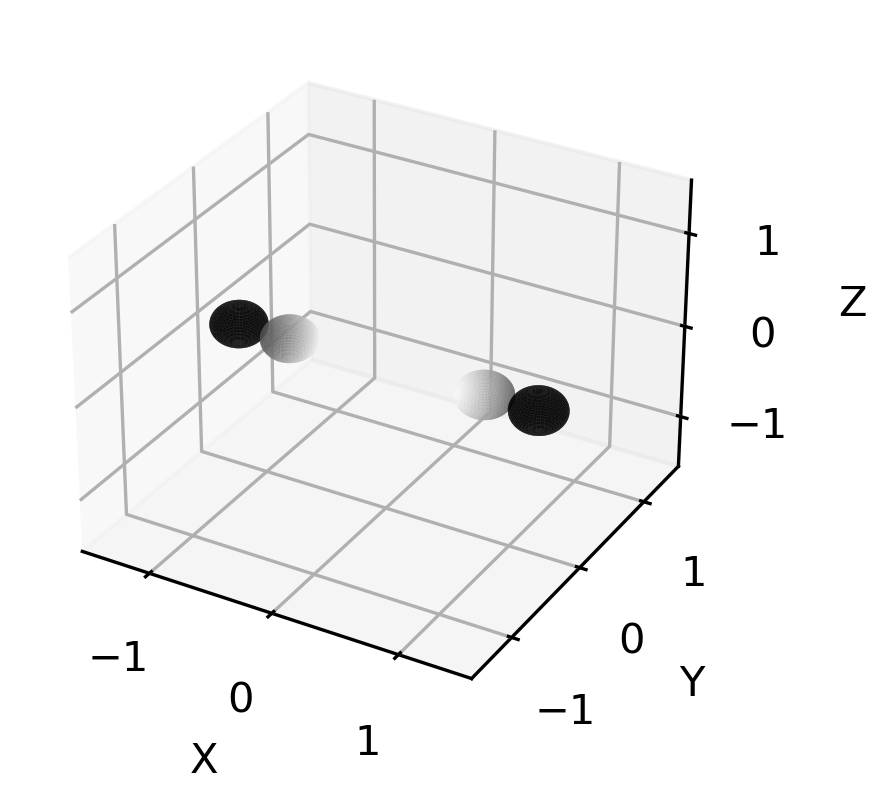

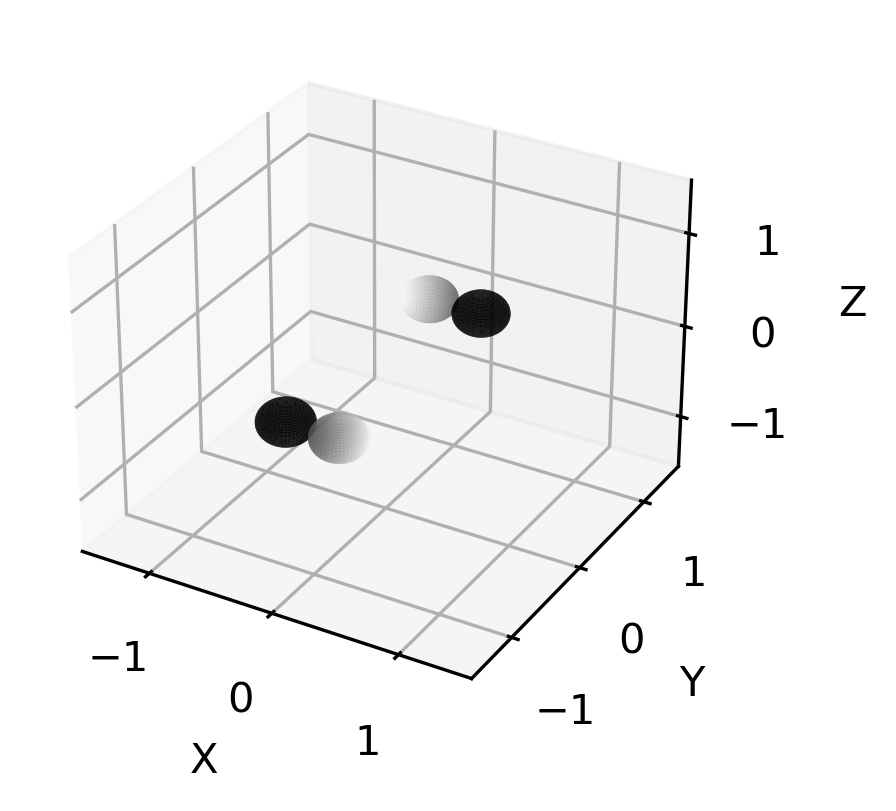

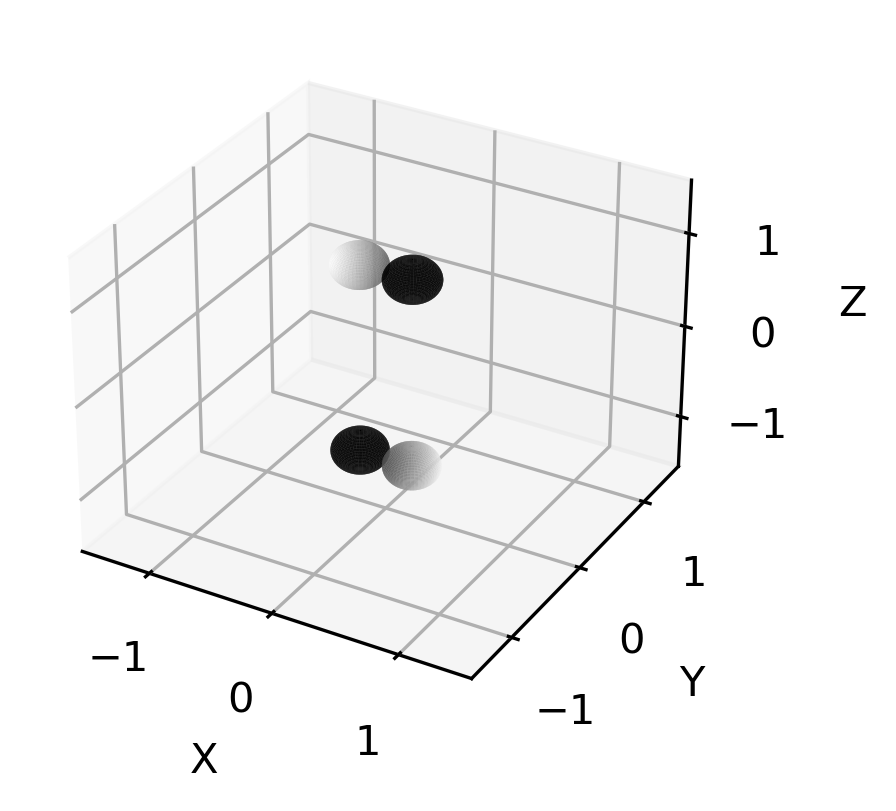

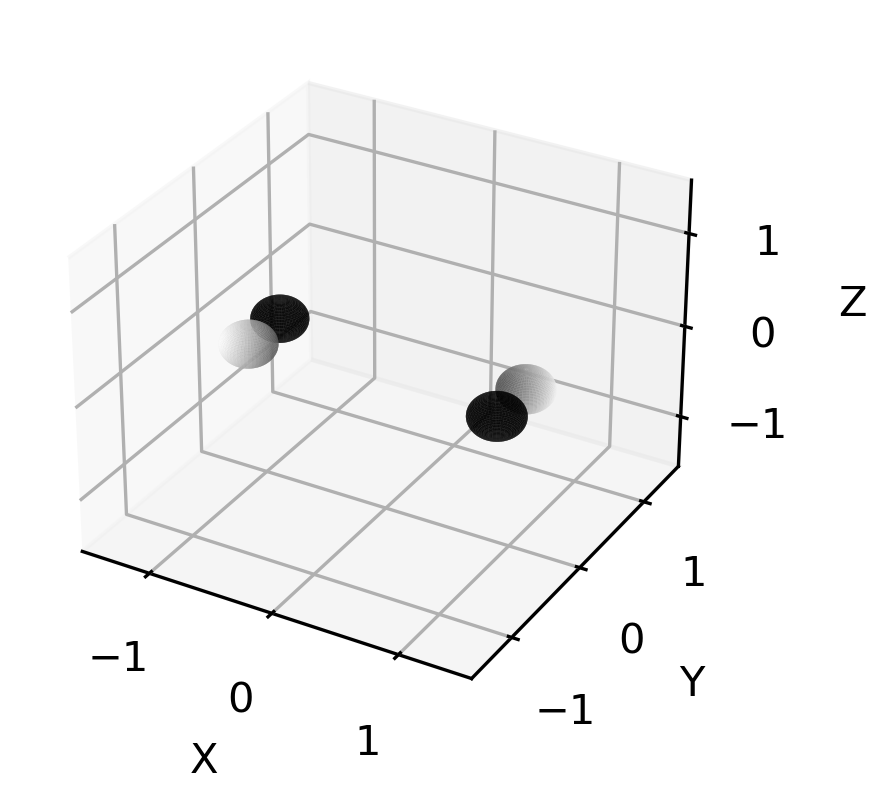

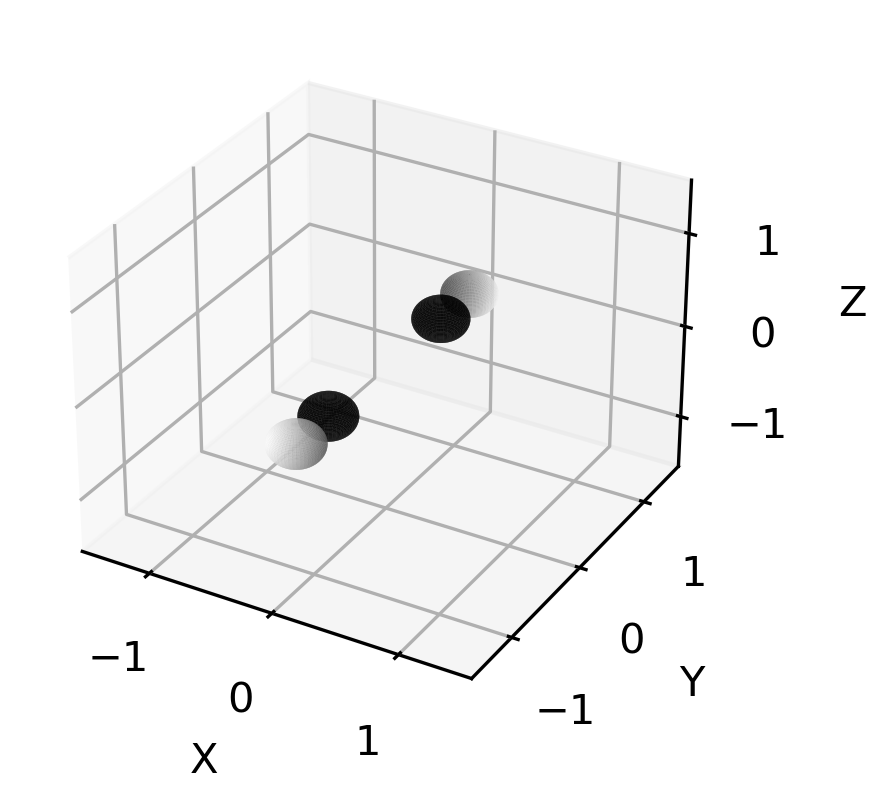

...

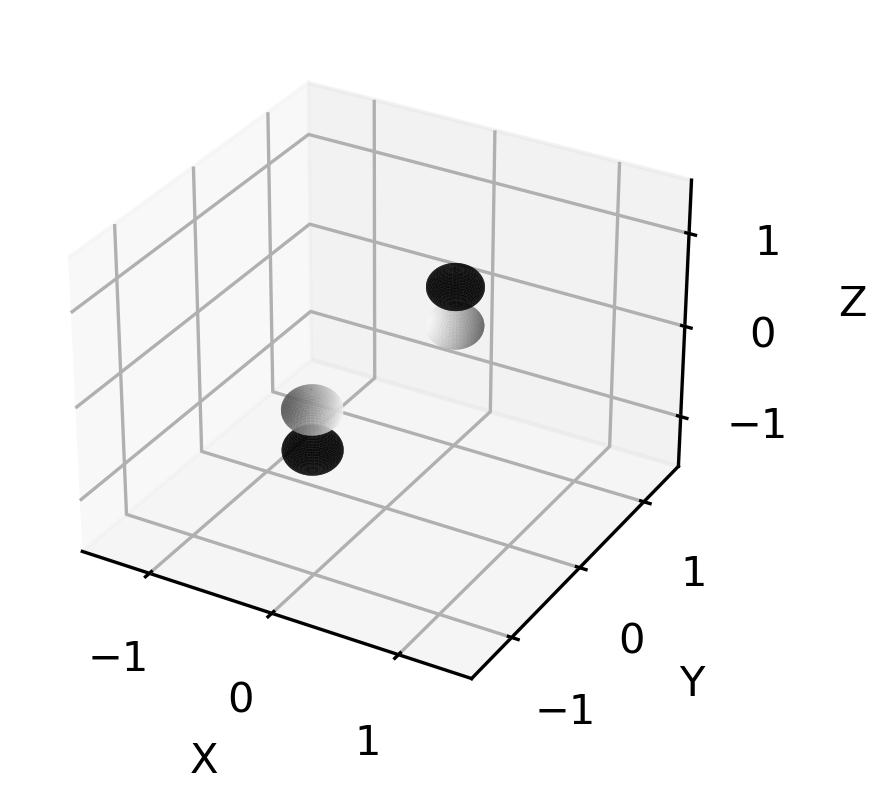

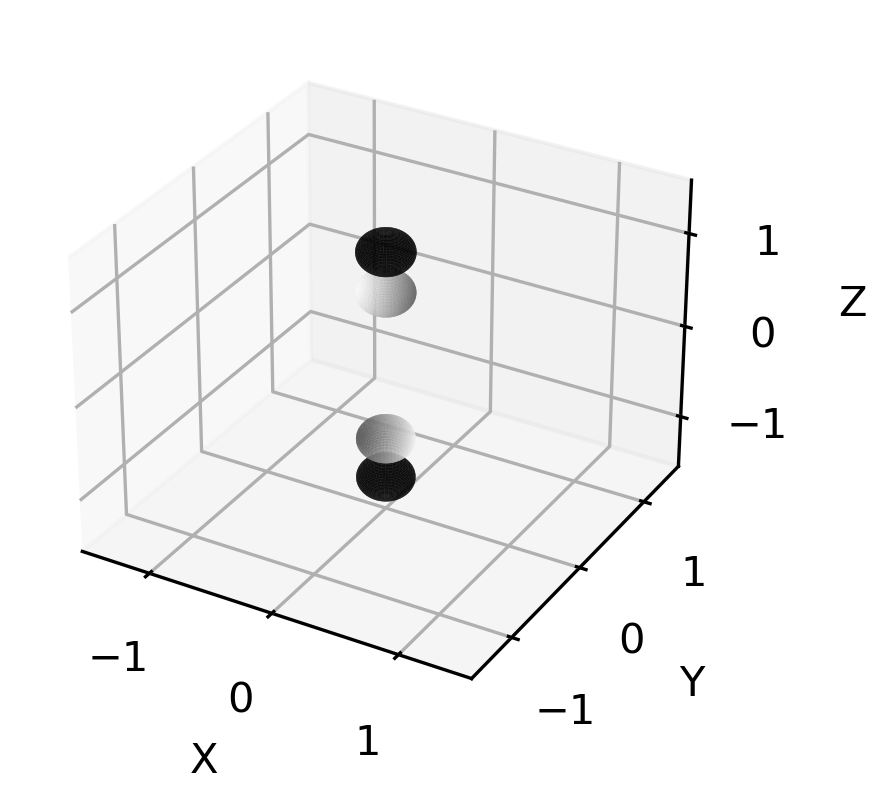

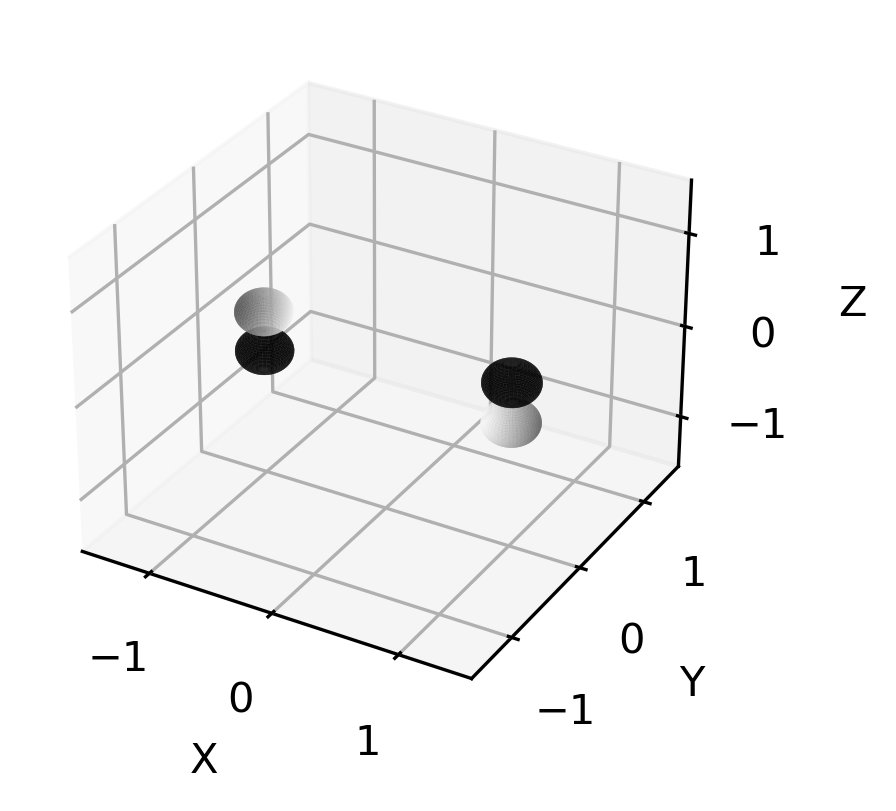

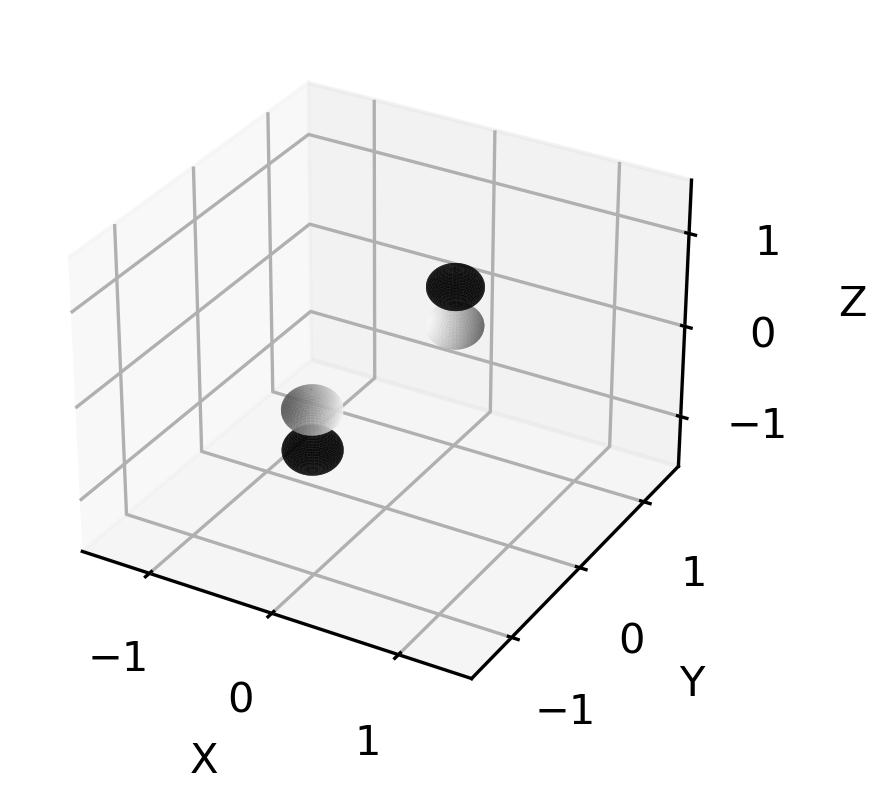

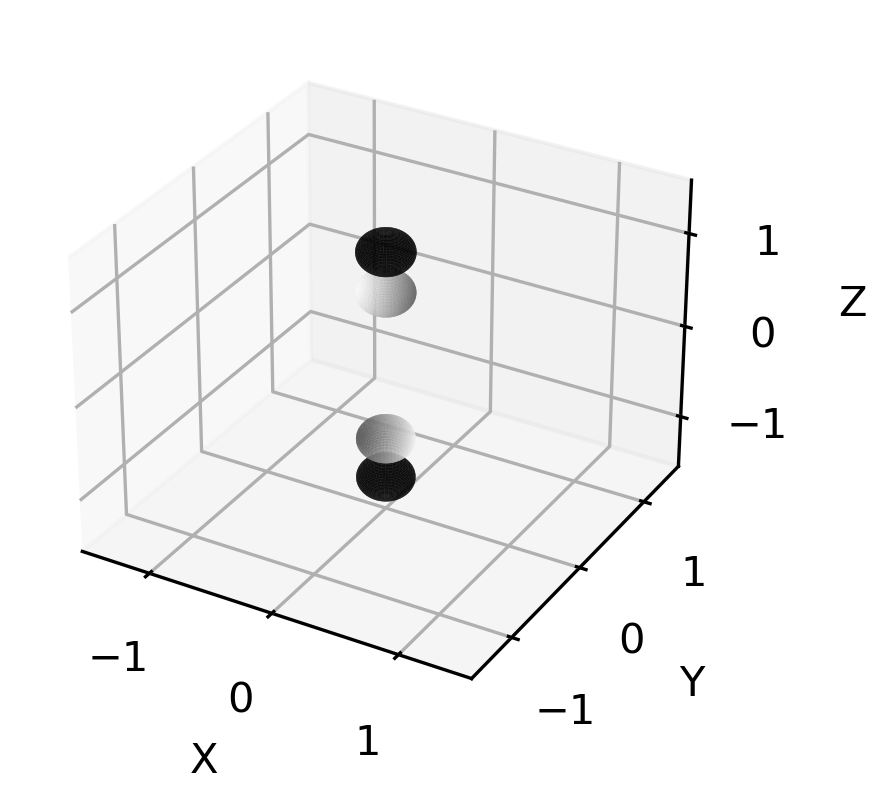

In [41]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])
plist = ["P_x_1", "P_y_1", "P_z_1", "P_x_2", "P_y_2", "P_z_2", "P_x_3", "P_y_3", "P_z_3", "P_x_4", "P_y_4", "P_z_4", "P_x_5", "P_y_5", "P_z_5", "P_x_6", "P_y_6", "P_z_6"]
basis_set = []
columns = []

for i in range(18):

    basis = np.eye(18)[:,i].reshape(18,1).astype(np.float64)
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Aplus1[index].astype(np.float64)
        g = np.kron(element.symmetry, element.transform)
        
        transformed_basis += character*(g@basis)
        
    basis_set.append(transformed_basis)

ortho_basis = gram_schmidt(basis_set)

ortho_basis = np.hstack(ortho_basis)
df = pd.DataFrame(ortho_basis, index=plist, columns=plist )

non_zero = (df != 0).any(axis=0)
df.loc[:, non_zero]

non_zero = (df != 0).any(axis=0)
display(df.loc[:, non_zero])

for col_key in df.loc[:, non_zero]:
    
    indices = df.loc[df.loc[:,col_key] != 0, col_key].index
    
    
    fig = plt.figure(figsize=(3,3), dpi=300)
    ax = plt.axes(projection='3d')
    
    for index in indices:
        
        sign = df.loc[index, col_key]
        
        orbital, direction, point = index.split("_")
            
        position = S_orbitals[:, int(point)-1]
    
        plot_orbital(sign, direction, position)

    plt.show()
 

<h5>$E^{+}$</h5>

,P_x_1,P_y_1,P_z_1,P_x_2,P_y_2,P_z_2,P_x_3,P_y_3,P_z_3,P_x_4,P_y_4,P_z_4,P_x_5,P_y_5,P_z_5,P_x_6,P_y_6,P_z_6
P_x_1,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_1,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_1,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,-0.707107,0.000000,0.000000
P_x_2,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_2,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_2,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.707107,0.000000
P_x_3,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_3,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.707107,0.000000,0.000000
P_x_4,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


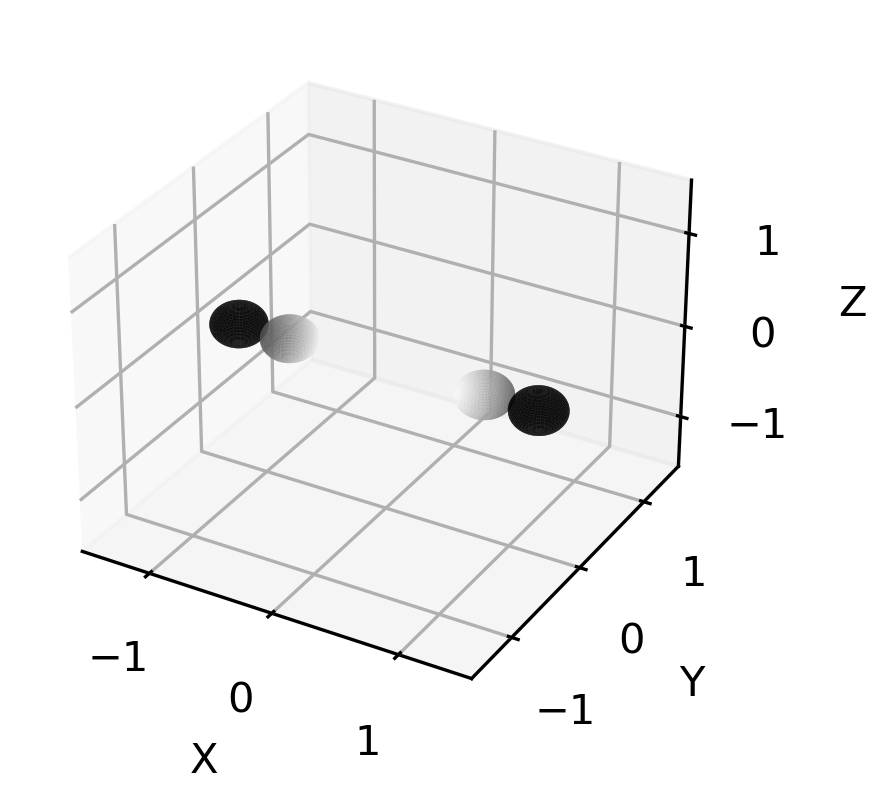

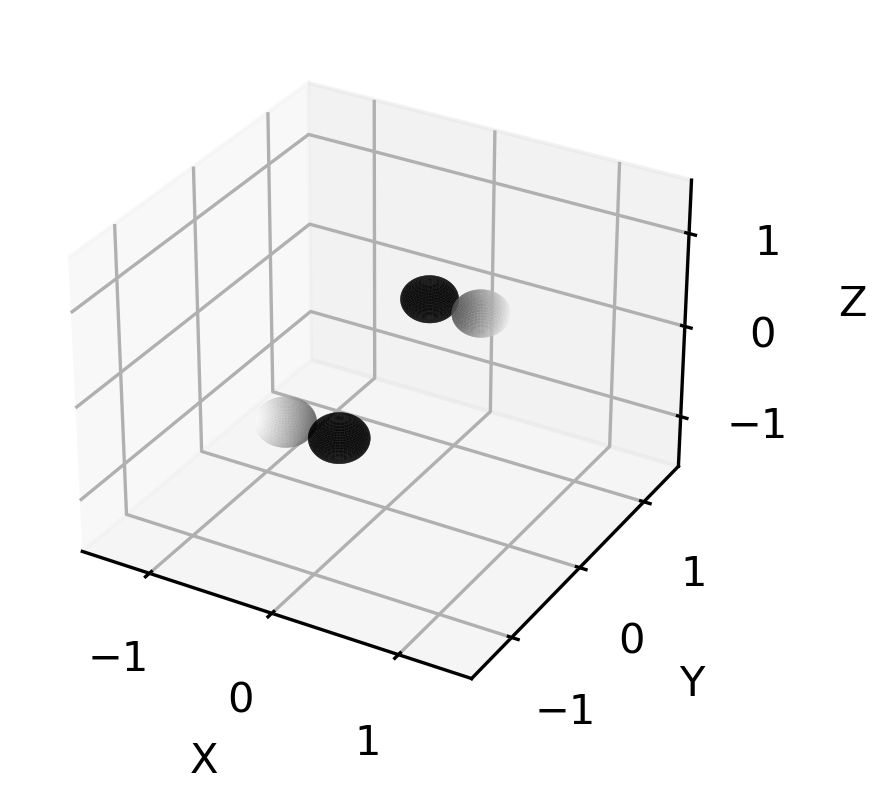

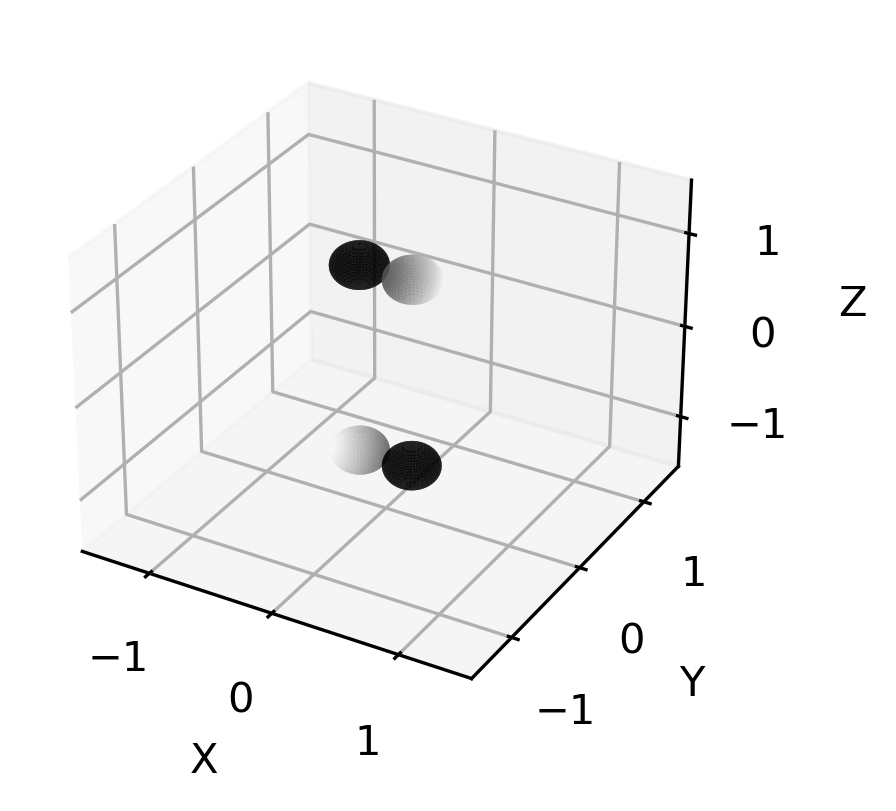

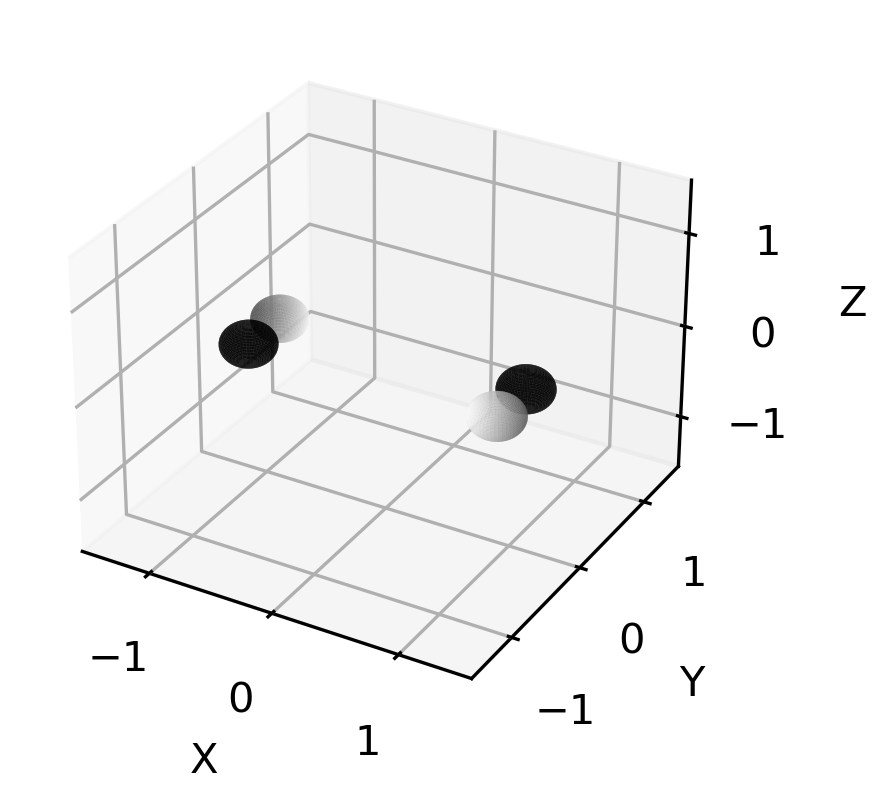

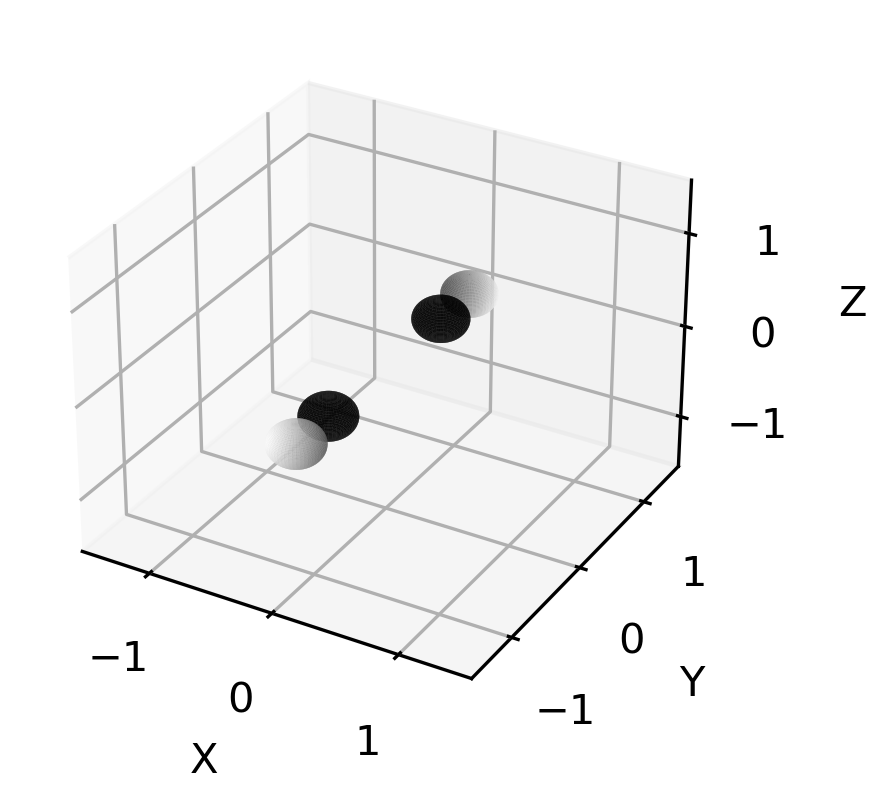

...

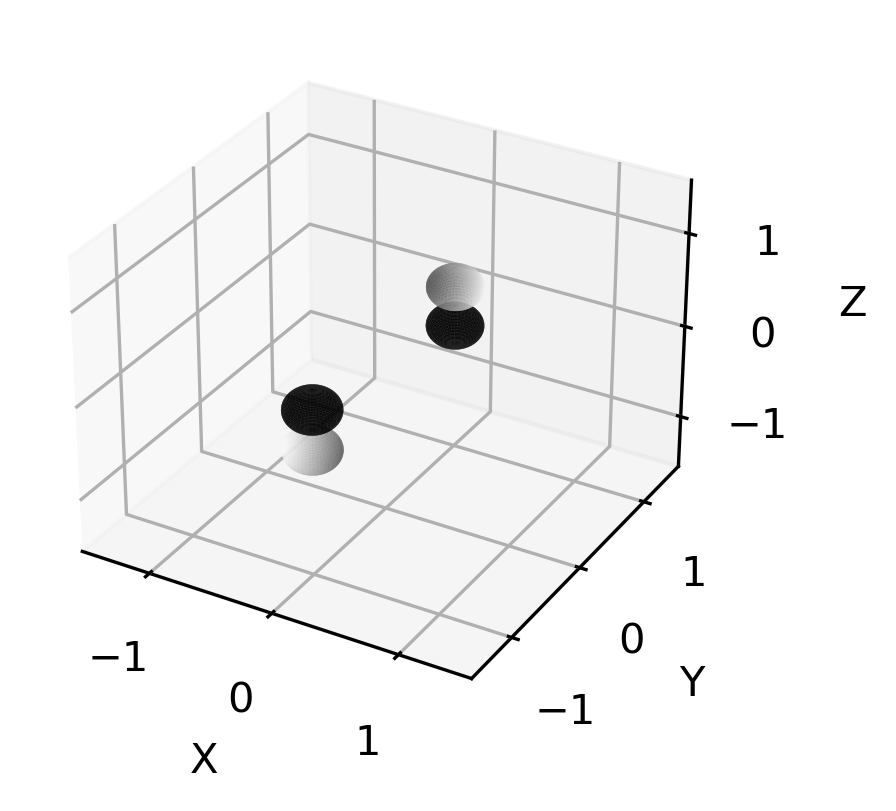

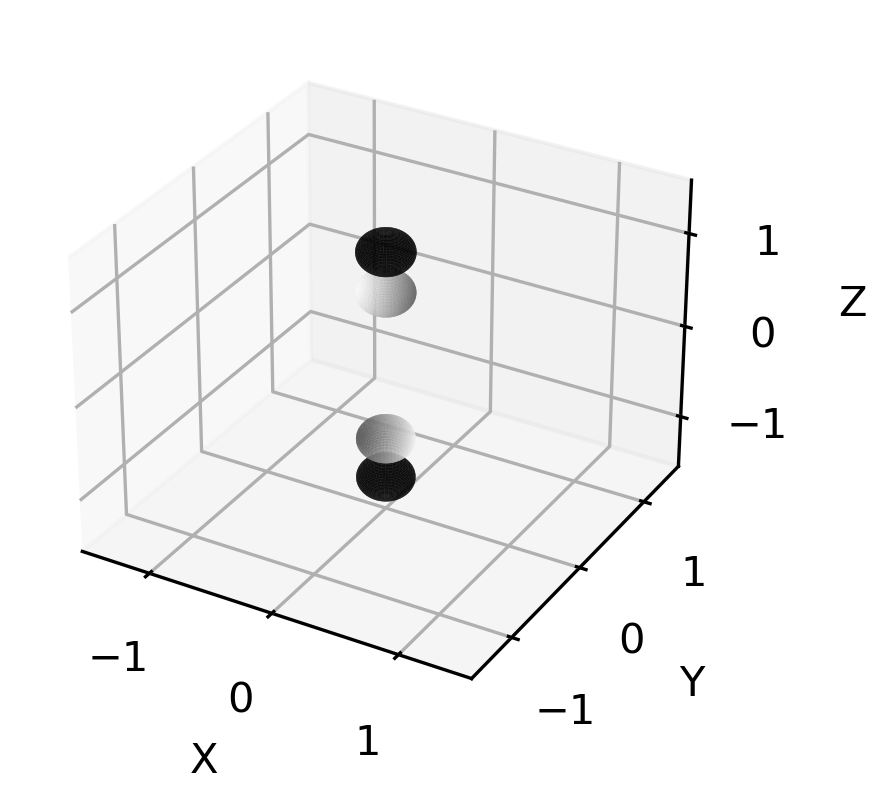

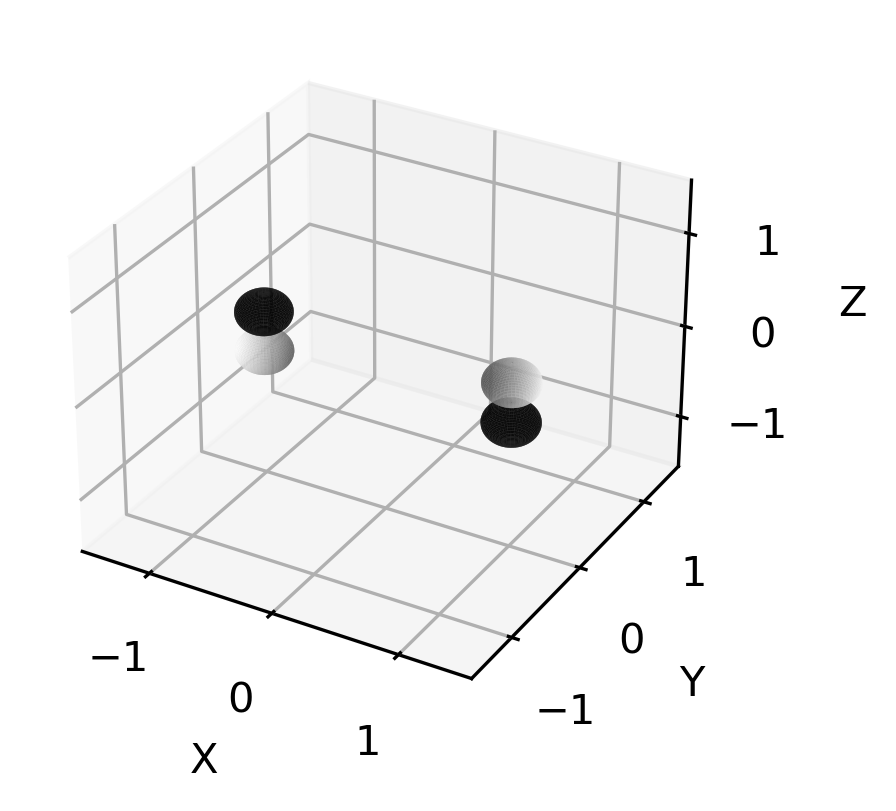

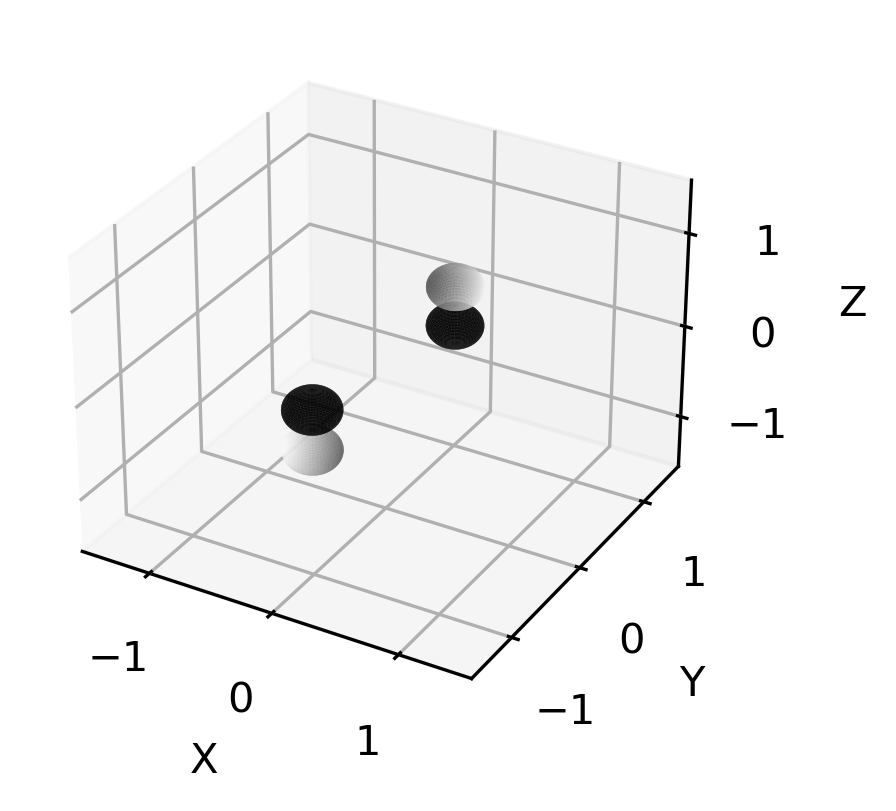

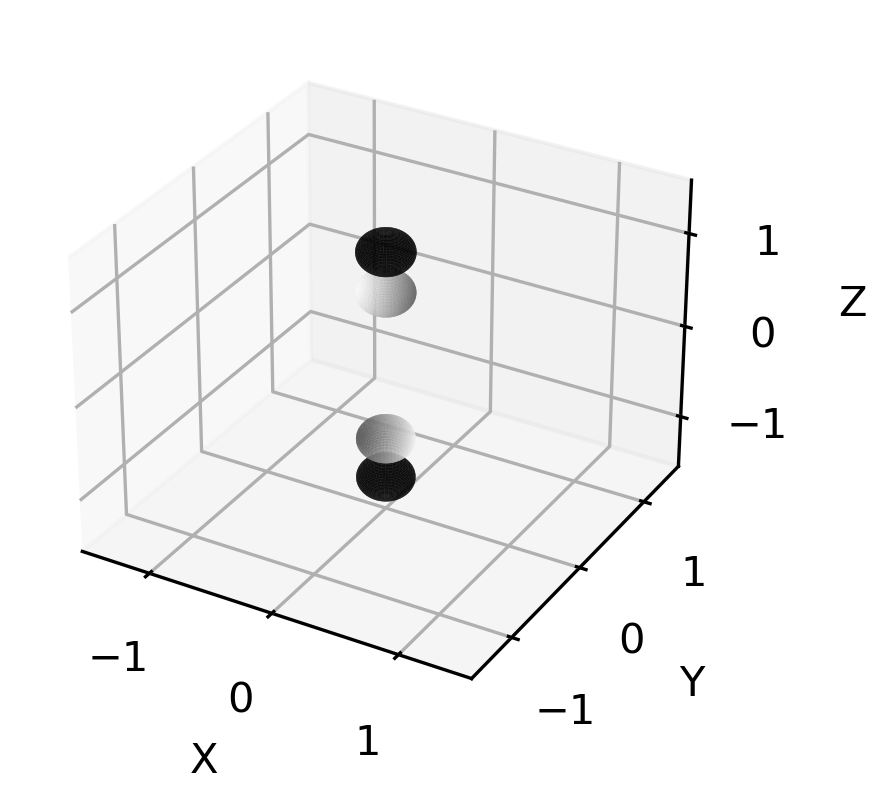

In [42]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])
plist = ["P_x_1", "P_y_1", "P_z_1", "P_x_2", "P_y_2", "P_z_2", "P_x_3", "P_y_3", "P_z_3", "P_x_4", "P_y_4", "P_z_4", "P_x_5", "P_y_5", "P_z_5", "P_x_6", "P_y_6", "P_z_6"]
basis_set = []
columns = []

for i in range(18):

    basis = np.eye(18)[:,i].reshape(18,1).astype(np.float64)
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Eplus[index].astype(np.float64)
        g = np.kron(element.symmetry, element.transform)
        
        transformed_basis += character*(g@basis)
        
    basis_set.append(transformed_basis)

ortho_basis = gram_schmidt(basis_set)


ortho_basis = np.hstack(ortho_basis)
df = pd.DataFrame(ortho_basis, index=plist, columns=plist )

non_zero = (df != 0).any(axis=0)
display(df.loc[:, non_zero])

for col_key in df.loc[:, non_zero]:
    
    indices = df.loc[df.loc[:,col_key] != 0, col_key].index
    
    
    fig = plt.figure(figsize=(3,3), dpi=300)
    ax = plt.axes(projection='3d')
    
    for index in indices:
        
        sign = df.loc[index, col_key]
        
        orbital, direction, point = index.split("_")
            
        position = S_orbitals[:, int(point)-1]
    
        plot_orbital(sign, direction, position)

    plt.show()
        


<h3>$T_1^{-}$</h3>

,P_x_1,P_y_1,P_z_1,P_x_2,P_y_2,P_z_2,P_x_3,P_y_3,P_z_3,P_x_4,P_y_4,P_z_4,P_x_5,P_y_5,P_z_5,P_x_6,P_y_6,P_z_6
P_x_1,0.707107,0.0,0.0,0.0,0.000000,0.0,-0.707107,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
P_y_1,0.000000,0.5,0.0,0.0,0.000000,0.0,0.000000,-0.5,0.0,0.0,0.000000,0.0,0.0,-0.5,0.000000,0.0,-0.5,0.000000
P_z_1,0.000000,0.0,0.5,0.0,0.000000,-0.5,0.000000,0.0,-0.5,0.0,0.000000,-0.5,0.0,0.0,0.000000,0.0,0.0,0.000000
P_x_2,0.000000,0.0,0.0,0.5,0.000000,0.0,0.000000,0.0,0.0,-0.5,0.000000,0.0,-0.5,0.0,0.000000,-0.5,0.0,0.000000
P_y_2,0.000000,0.0,0.0,0.0,0.707107,0.0,0.000000,0.0,0.0,0.0,-0.707107,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
P_z_2,0.000000,0.0,0.5,0.0,0.000000,-0.5,0.000000,0.0,-0.5,0.0,0.000000,-0.5,0.0,0.0,0.000000,0.0,0.0,0.000000
P_x_3,0.707107,0.0,0.0,0.0,0.000000,0.0,-0.707107,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000
P_y_3,0.000000,0.5,0.0,0.0,0.000000,0.0,0.000000,-0.5,0.0,0.0,0.000000,0.0,0.0,-0.5,0.000000,0.0,-0.5,0.000000
P_z_3,0.000000,0.0,0.5,0.0,0.000000,-0.5,0.000000,0.0,-0.5,0.0,0.000000,-0.5,0.0,0.0,0.000000,0.0,0.0,0.000000
P_x_4,0.000000,0.0,0.0,0.5,0.000000,0.0,0.000000,0.0,0.0,-0.5,0.000000,0.0,-0.5,0.0,0.000000,-0.5,0.0,0.000000


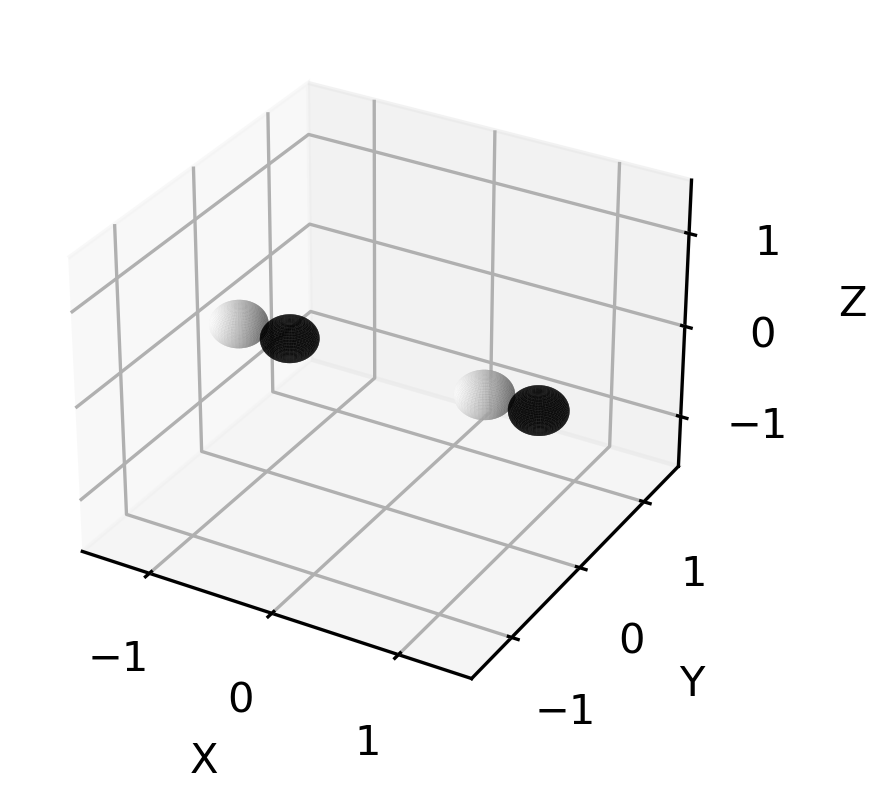

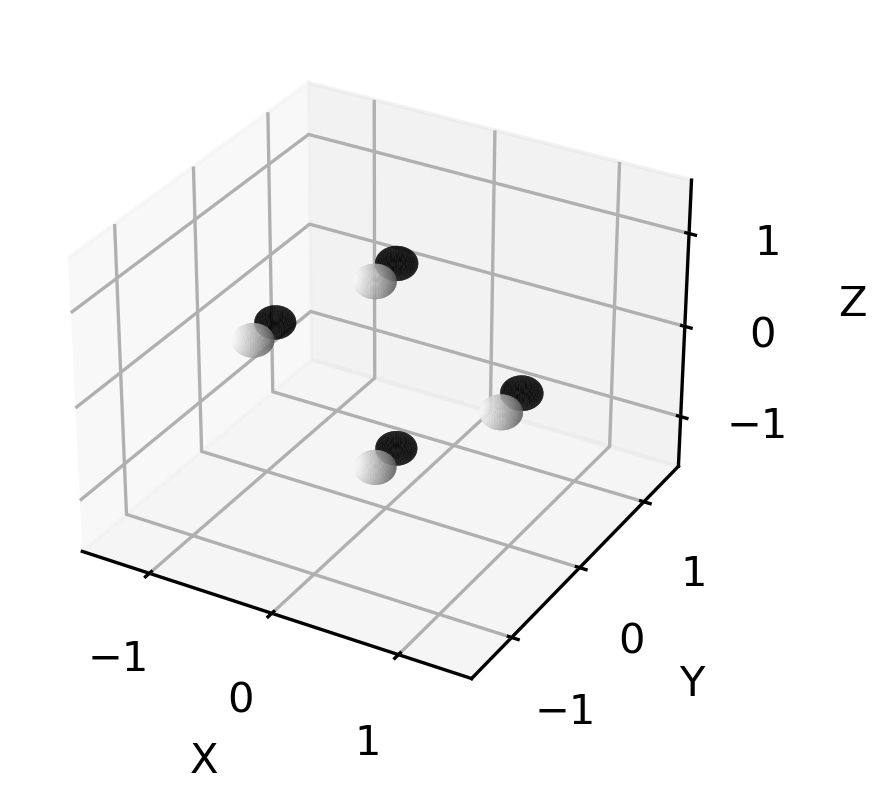

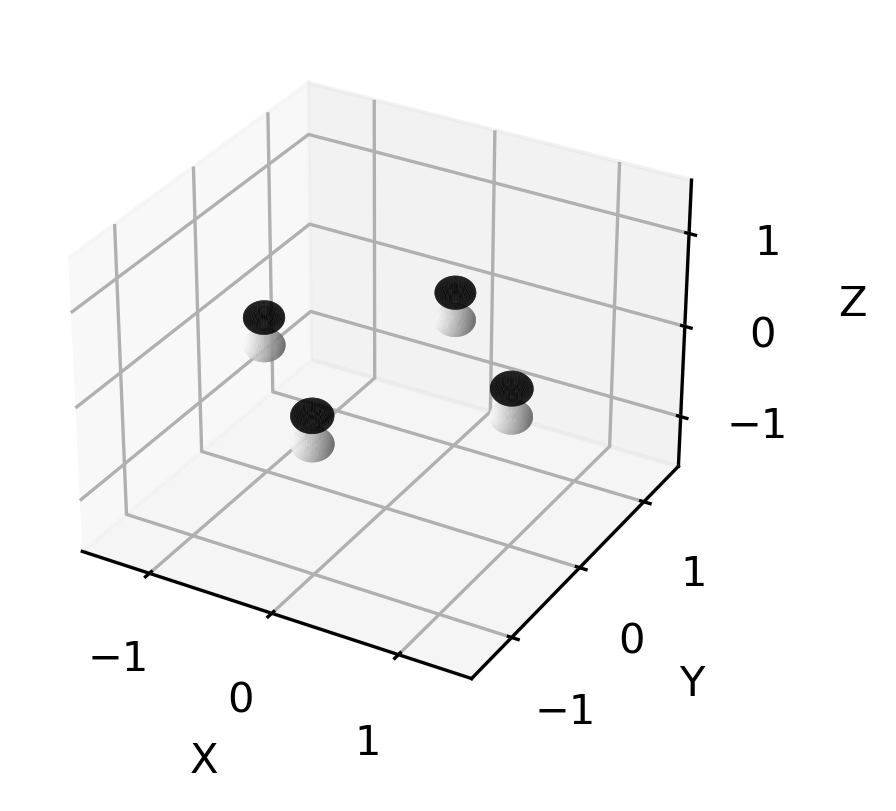

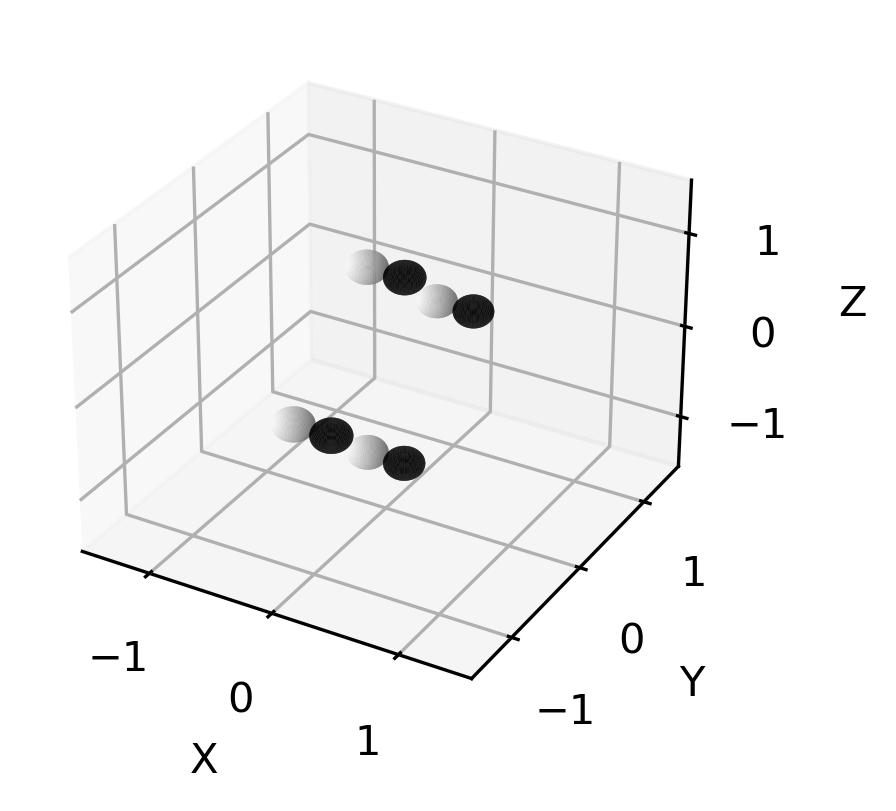

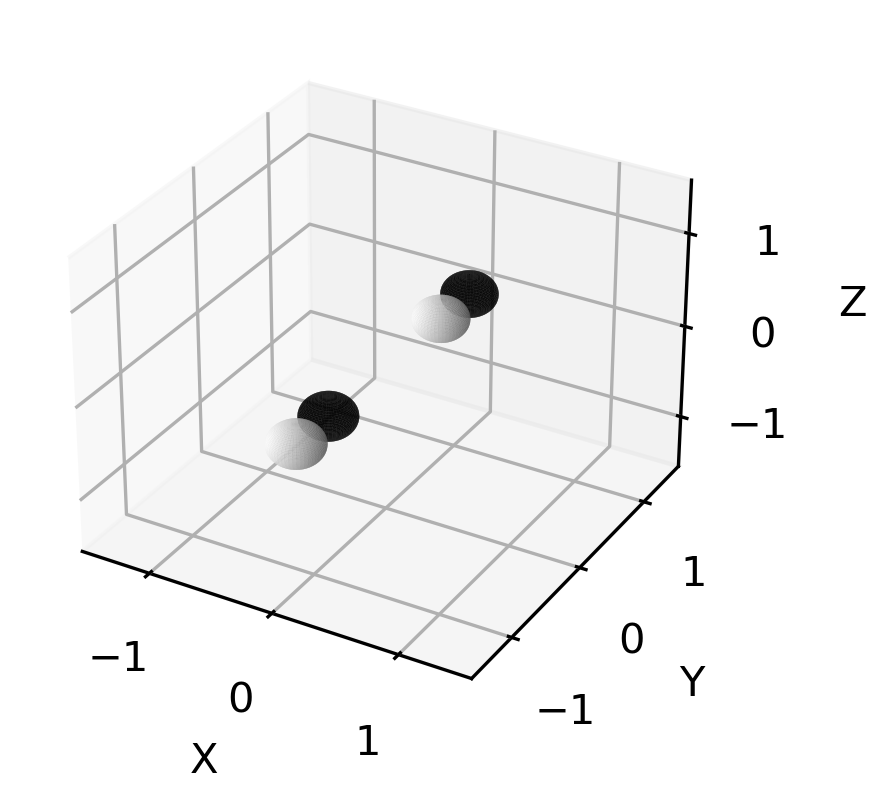

...

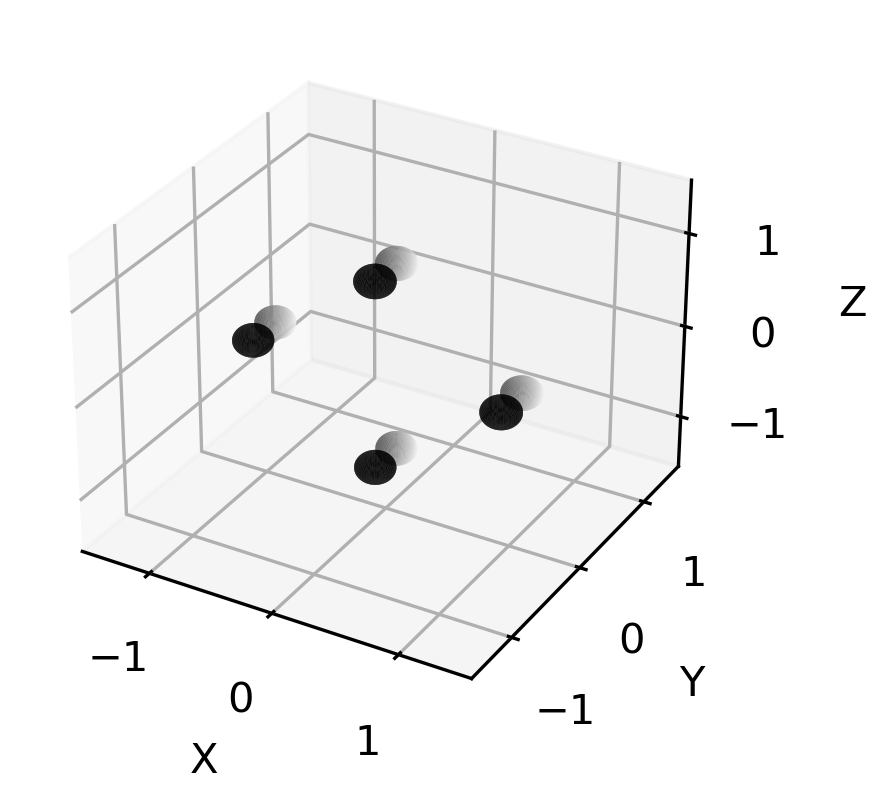

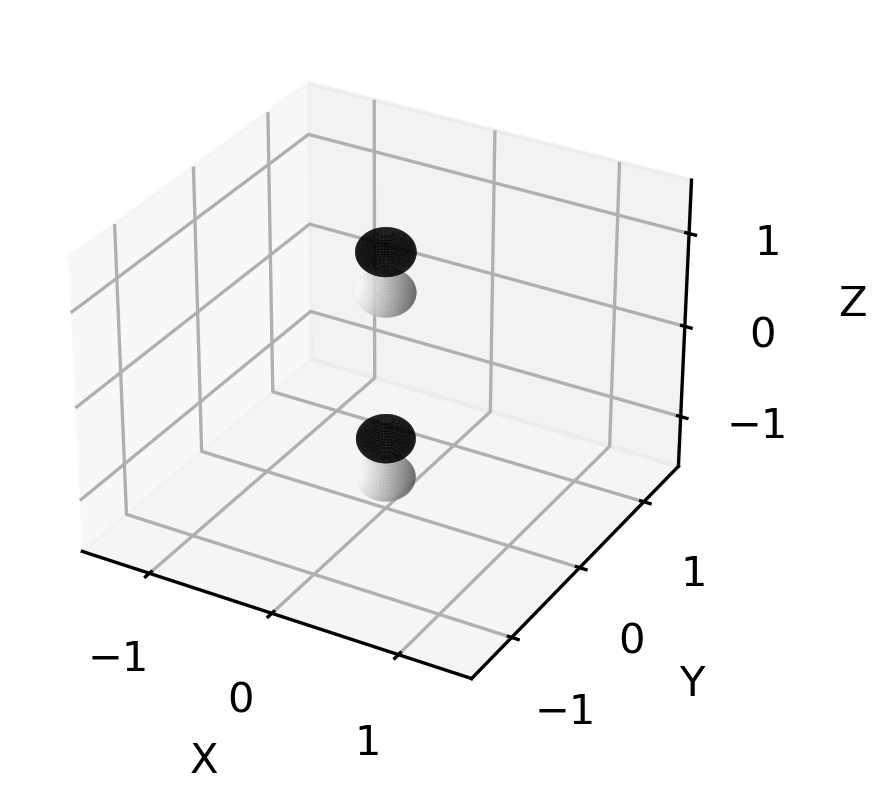

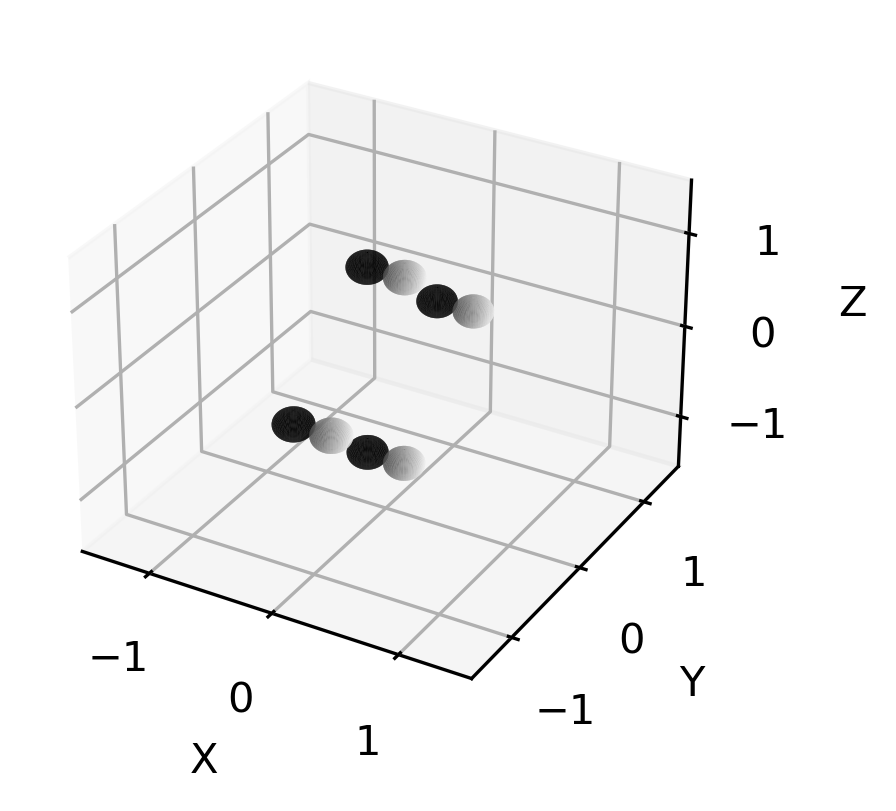

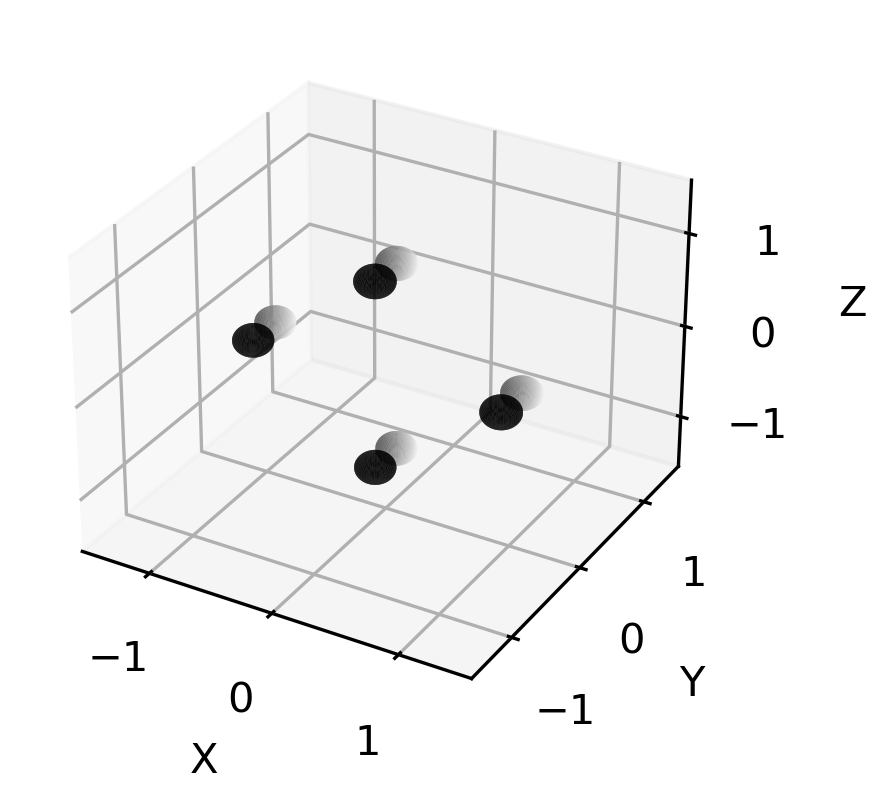

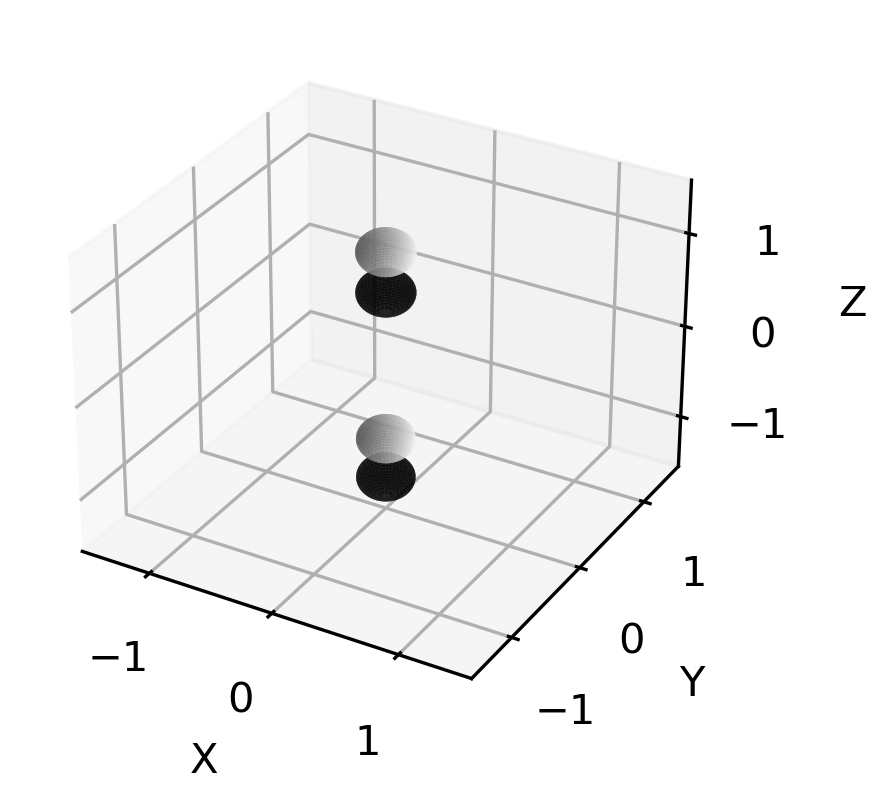

In [43]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])
plist = ["P_x_1", "P_y_1", "P_z_1", "P_x_2", "P_y_2", "P_z_2", "P_x_3", "P_y_3", "P_z_3", "P_x_4", "P_y_4", "P_z_4", "P_x_5", "P_y_5", "P_z_5", "P_x_6", "P_y_6", "P_z_6"]
basis_set = []
columns = []

for i in range(18):

    basis = np.eye(18)[:,i].reshape(18,1).astype(np.float64)
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Tminus1[index].astype(np.float64)
        g = np.kron(element.symmetry, element.transform)
        
        transformed_basis += character*(g@basis)
        
    basis_set.append(transformed_basis)

ortho_basis = gram_schmidt(basis_set)


ortho_basis = np.hstack(ortho_basis)
df = pd.DataFrame(ortho_basis, index=plist, columns=plist )

non_zero = (df != 0).any(axis=0)
display(df.loc[:, non_zero])

for col_key in df.loc[:, non_zero]:
    
    indices = df.loc[df.loc[:,col_key] != 0, col_key].index
    
    
    fig = plt.figure(figsize=(3,3), dpi=300)
    ax = plt.axes(projection='3d')
    
    for index in indices:
        
        sign = df.loc[index, col_key]
        
        orbital, direction, point = index.split("_")
            
        position = S_orbitals[:, int(point)-1]
    
        plot_orbital(sign, direction, position)

    plt.show()
        


<h3>$T_2^{-}$</h3>

,P_y_1,P_z_1,P_x_2,P_z_2,P_y_3,P_z_3,P_x_4,P_z_4,P_x_5,P_y_5,P_x_6,P_y_6
P_x_1,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_1,0.5,0.0,0.0,0.000000,-0.493884,0.042802,0.027832,-0.041194,-0.030954,0.475157,-0.011147,0.490886
P_z_1,0.0,0.5,0.0,0.473841,0.073934,-0.472187,-0.308190,0.454796,0.342619,-0.139744,0.341476,-0.093649
P_x_2,0.0,0.0,0.5,0.159609,0.024742,-0.158769,-0.392739,0.203626,0.362842,-0.068540,0.365061,-0.016154
P_y_2,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_2,0.0,-0.5,0.0,-0.473841,-0.073934,0.472187,0.308190,-0.454796,-0.342619,0.139744,-0.341476,0.093649
P_x_3,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_3,0.5,0.0,0.0,0.000000,-0.493884,0.042802,0.027832,-0.041194,-0.030954,0.475157,-0.011147,0.490886
P_z_3,0.0,0.5,0.0,0.473841,0.073934,-0.472187,-0.308190,0.454796,0.342619,-0.139744,0.341476,-0.093649
P_x_4,0.0,0.0,0.5,0.159609,0.024742,-0.158769,-0.392739,0.203626,0.362842,-0.068540,0.365061,-0.016154


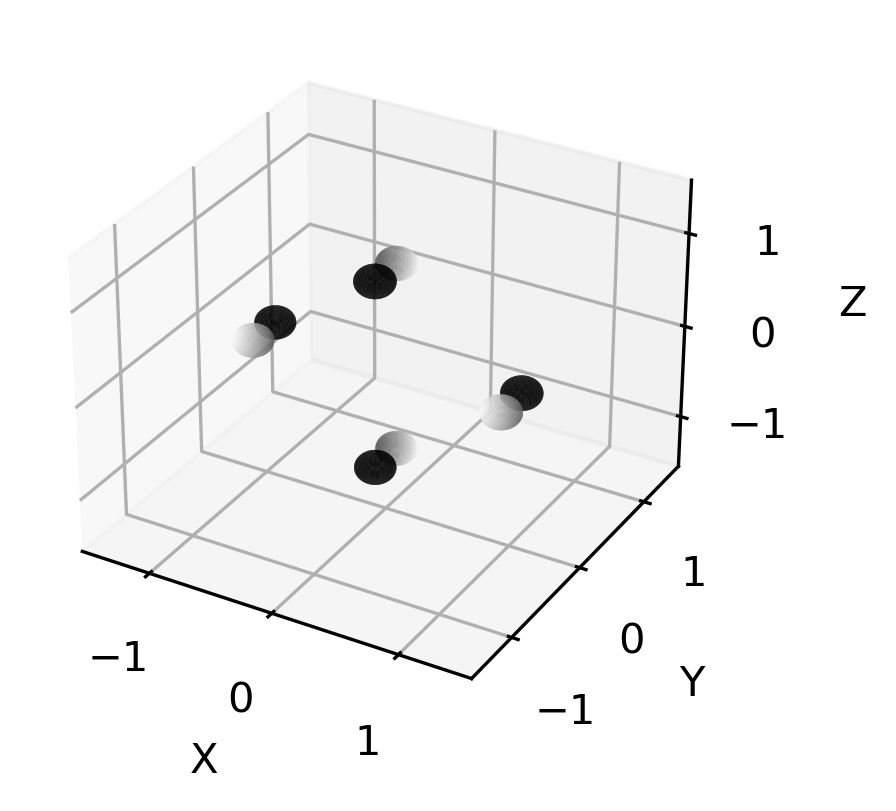

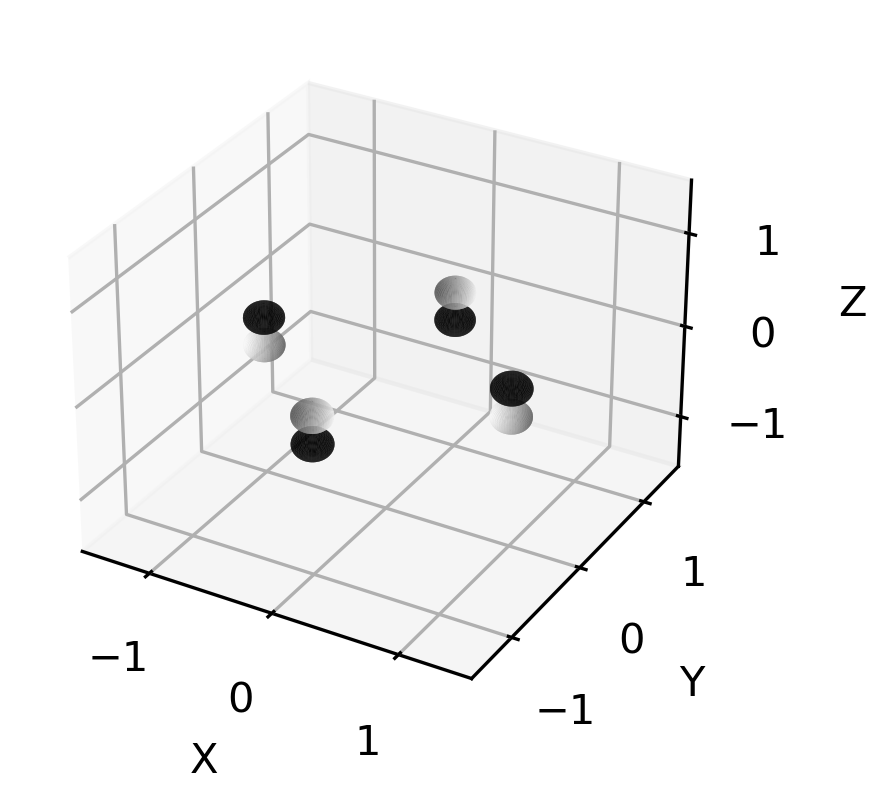

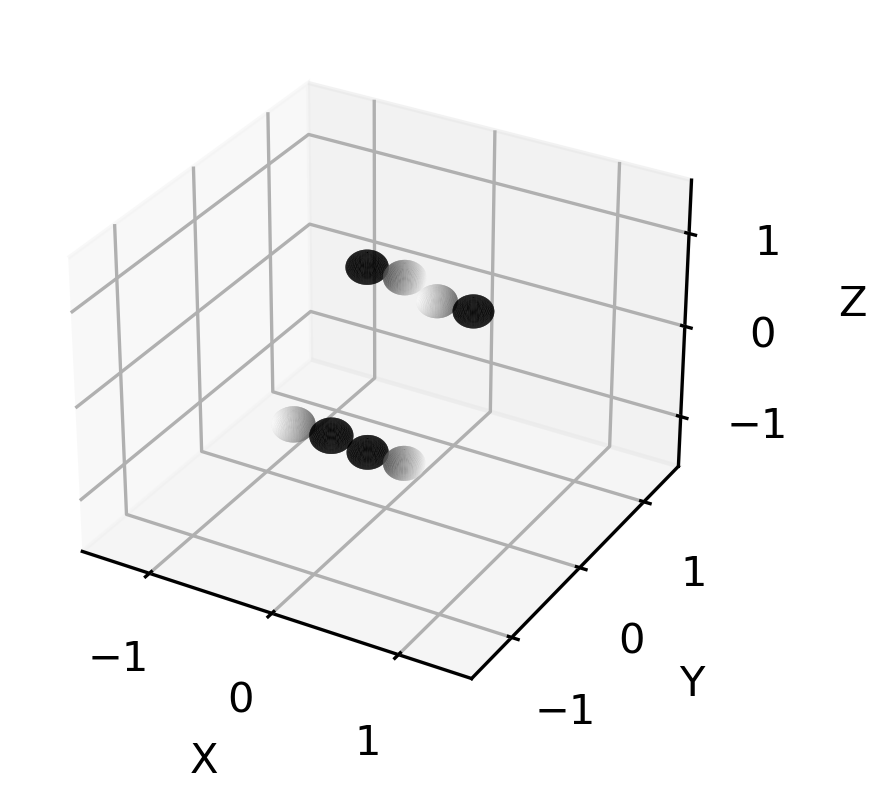

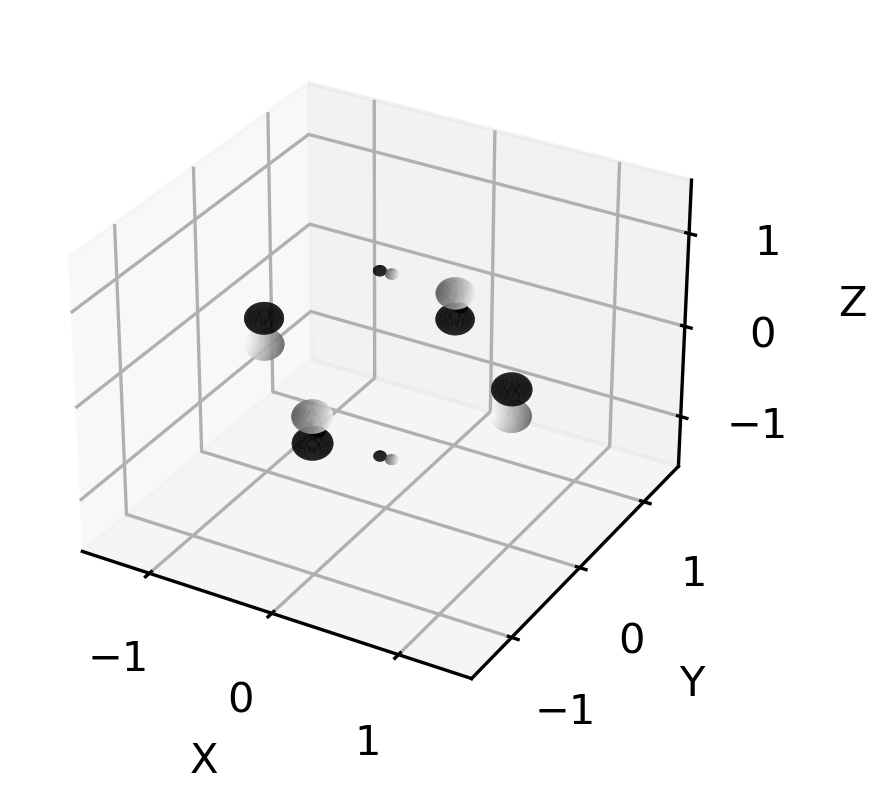

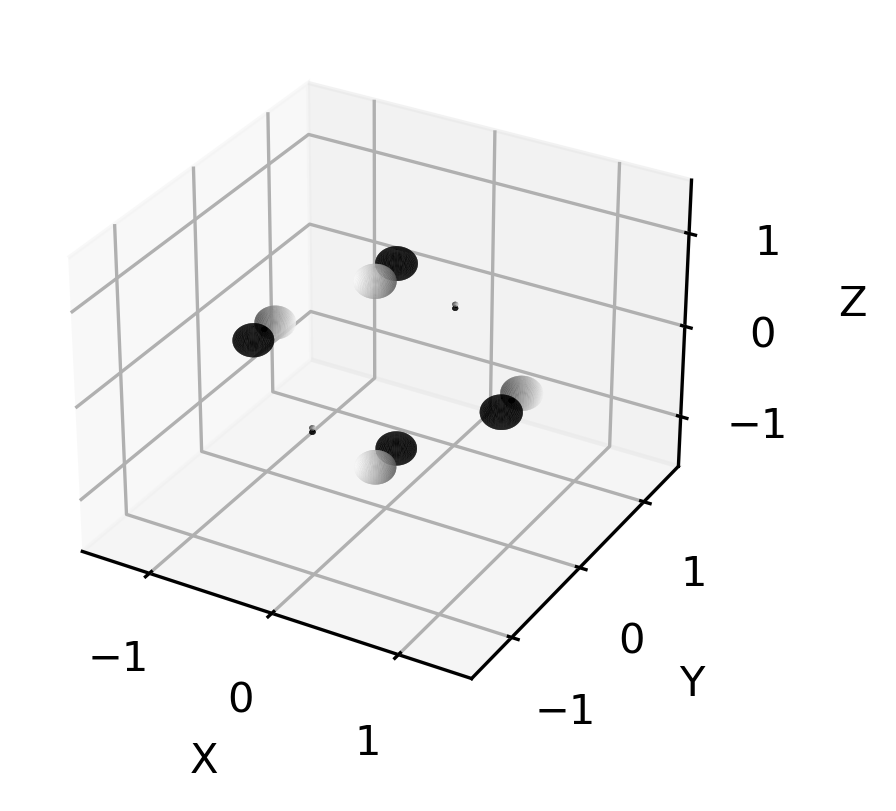

...

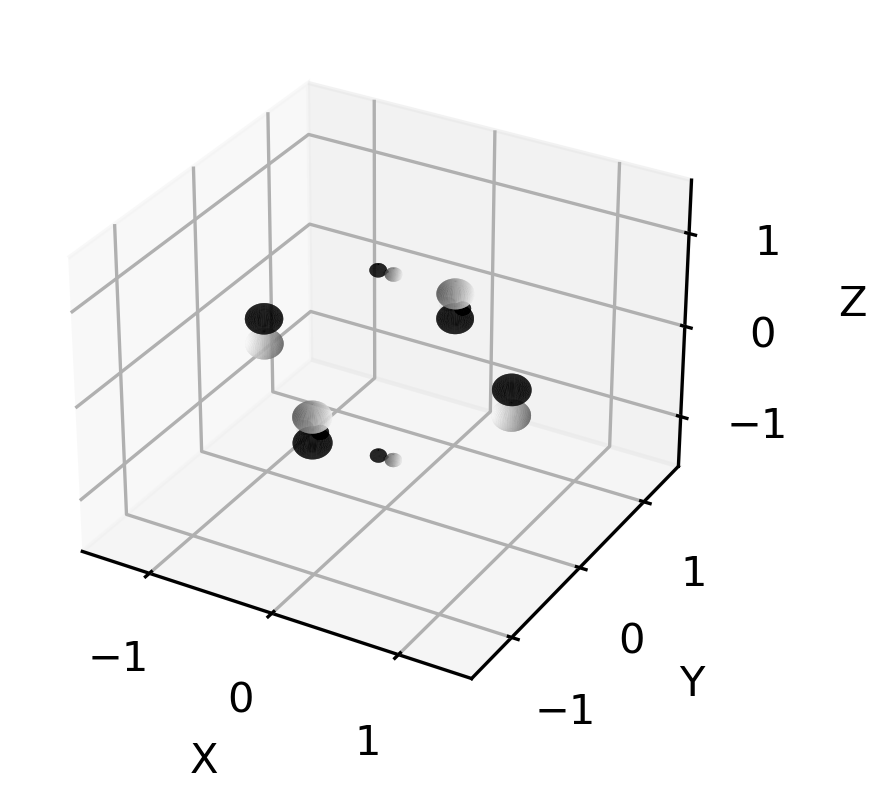

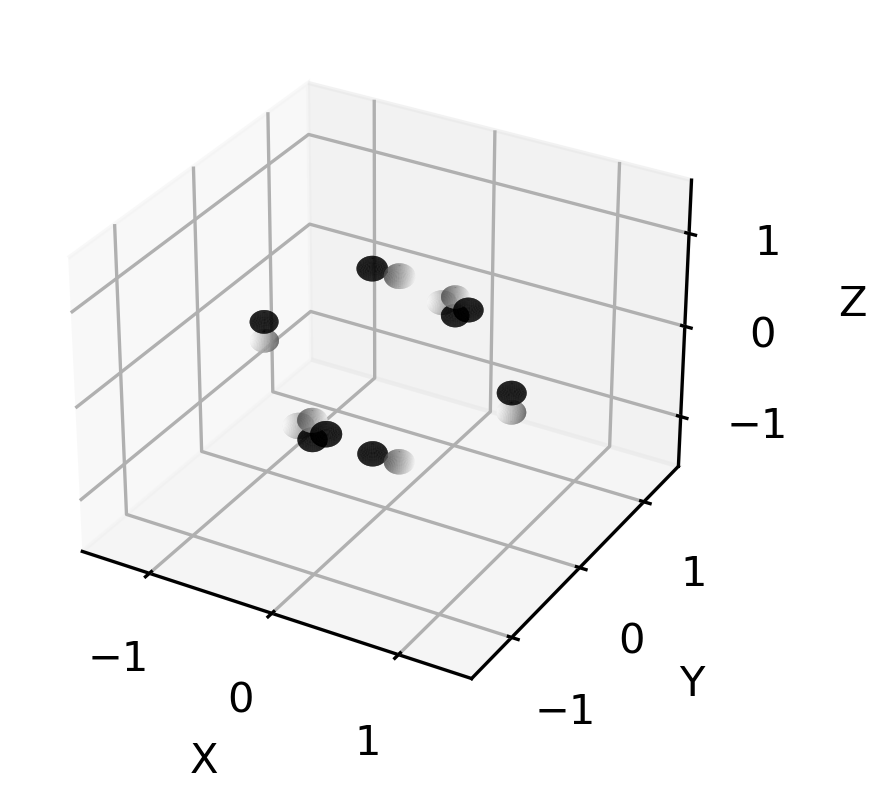

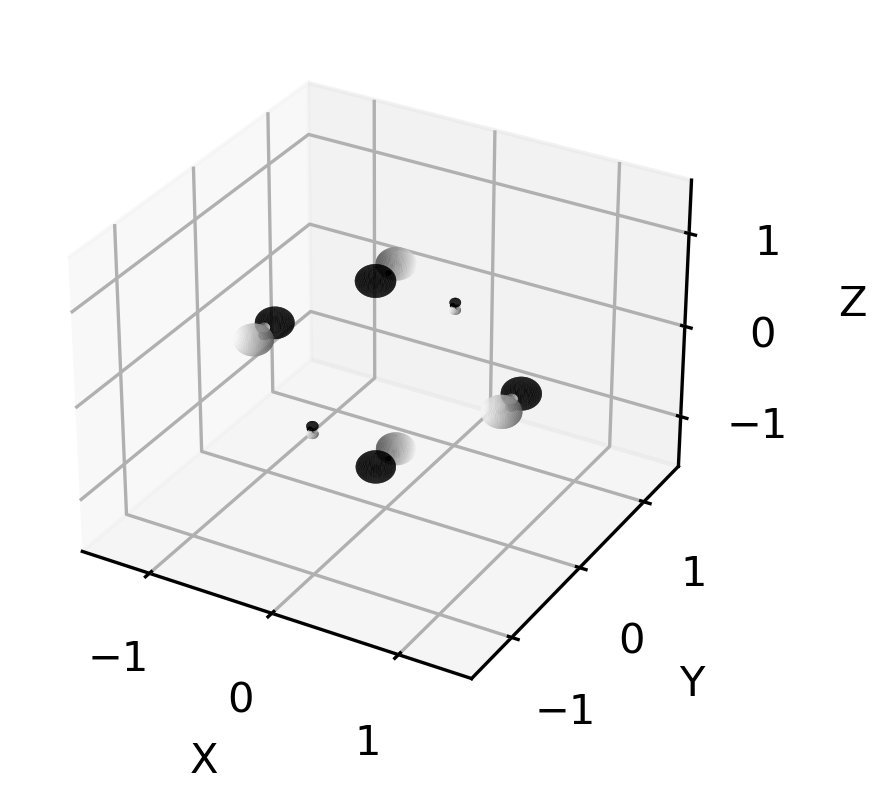

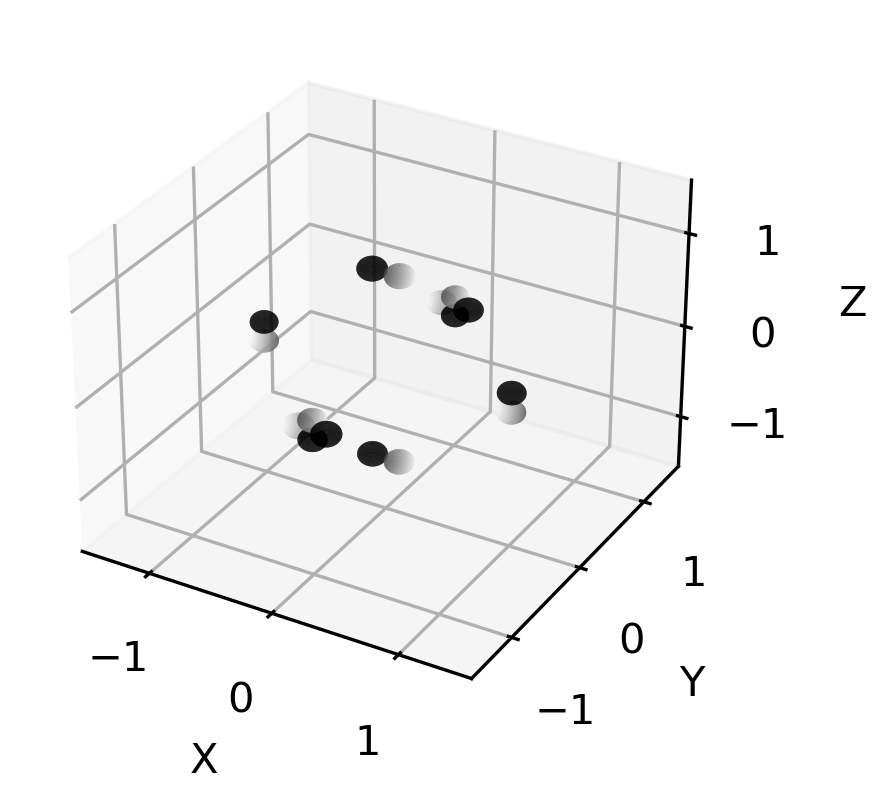

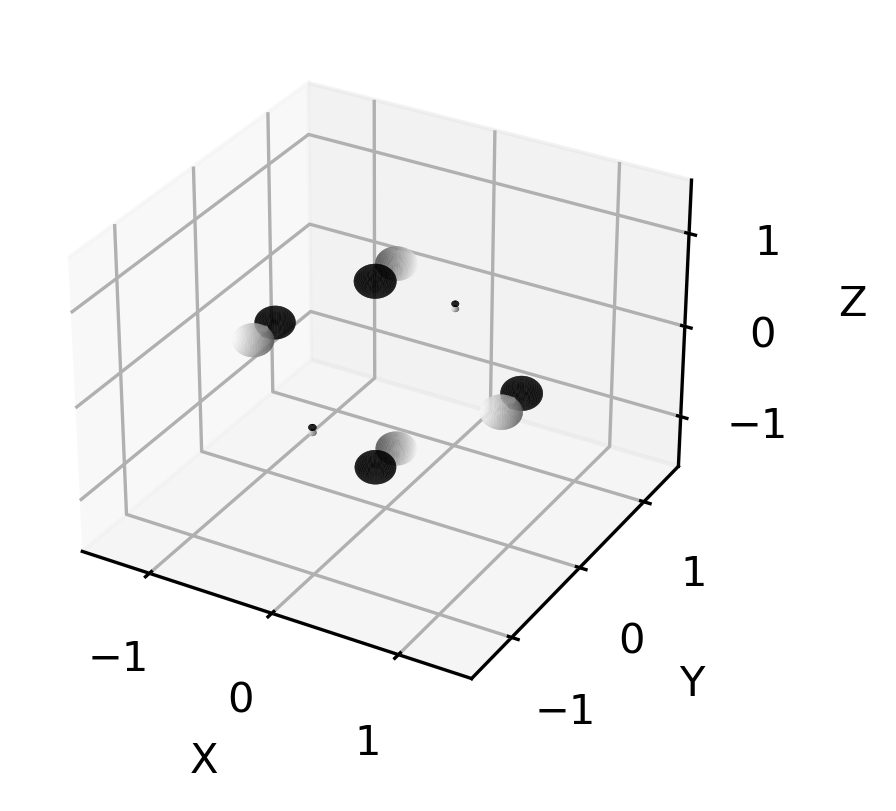

In [44]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])
plist = ["P_x_1", "P_y_1", "P_z_1", "P_x_2", "P_y_2", "P_z_2", "P_x_3", "P_y_3", "P_z_3", "P_x_4", "P_y_4", "P_z_4", "P_x_5", "P_y_5", "P_z_5", "P_x_6", "P_y_6", "P_z_6"]
basis_set = []
columns = []

for i in range(18):

    basis = np.eye(18)[:,i].reshape(18,1).astype(np.float64)
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Tminus2[index].astype(np.float64)
        g = np.kron(element.symmetry, element.transform)
        
        transformed_basis += character*(g@basis)
        
    basis_set.append(transformed_basis)
    
ortho_basis = gram_schmidt(basis_set)


ortho_basis = np.hstack(ortho_basis)
df = pd.DataFrame(ortho_basis, index=plist, columns=plist )

non_zero = (df != 0).any(axis=0)
display(df.loc[:, non_zero])

for col_key in df.loc[:, non_zero]:
    
    indices = df.loc[df.loc[:,col_key] != 0, col_key].index
    
    
    fig = plt.figure(figsize=(3,3), dpi=300)
    ax = plt.axes(projection='3d')
    
    for index in indices:
        
        sign = df.loc[index, col_key]
        
        orbital, direction, point = index.split("_")
            
        position = S_orbitals[:, int(point)-1]
    
        plot_orbital(sign, direction, position)

    plt.show()
        


<h3>$T_1^{+}$</h3>

,P_x_1,P_y_1,P_z_1,P_x_2,P_y_2,P_z_2,P_x_3,P_y_3,P_z_3,P_x_4,P_y_4,P_z_4,P_x_5,P_y_5,P_z_5,P_x_6,P_y_6,P_z_6
P_x_1,0.0,0.000000,0.000000,0.000000,0.015867,0.000000,0.007995,0.000000,0.000000,0.000000,-0.013230,0.000000,0.000000,0.000000,-0.013231,0.000000,0.000000,0.013231
P_y_1,0.0,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_1,0.0,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_x_2,0.0,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_2,0.5,0.000000,0.000000,0.000000,0.507745,0.000000,0.503950,0.000000,0.000000,0.000000,-0.506484,0.000000,0.000000,0.000000,-0.502562,0.000000,0.000000,0.502562
P_z_2,0.0,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_x_3,0.0,0.000000,0.000000,0.000000,-0.015867,0.000000,-0.007995,0.000000,0.000000,0.000000,0.013230,0.000000,0.000000,0.000000,0.013231,0.000000,0.000000,-0.013231
P_y_3,0.0,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_3,0.0,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_x_4,0.0,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


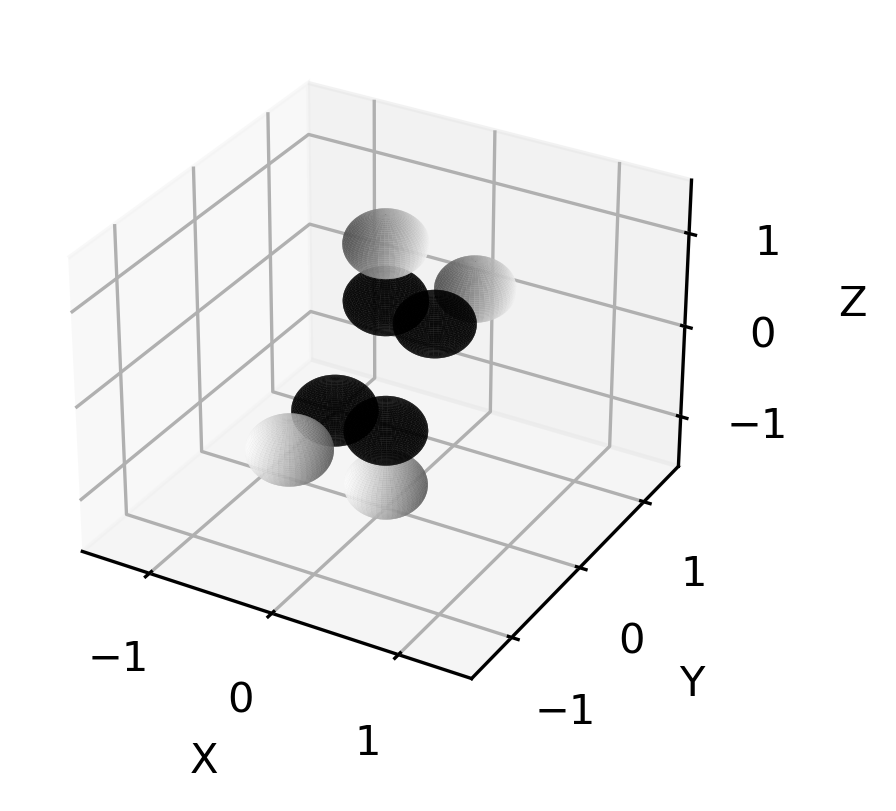

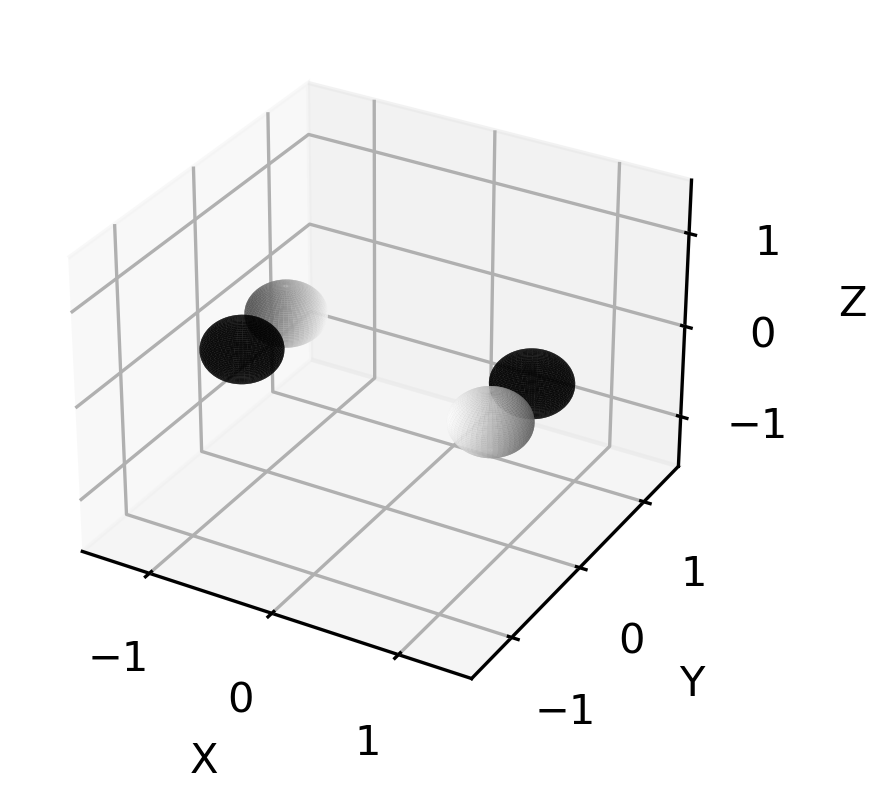

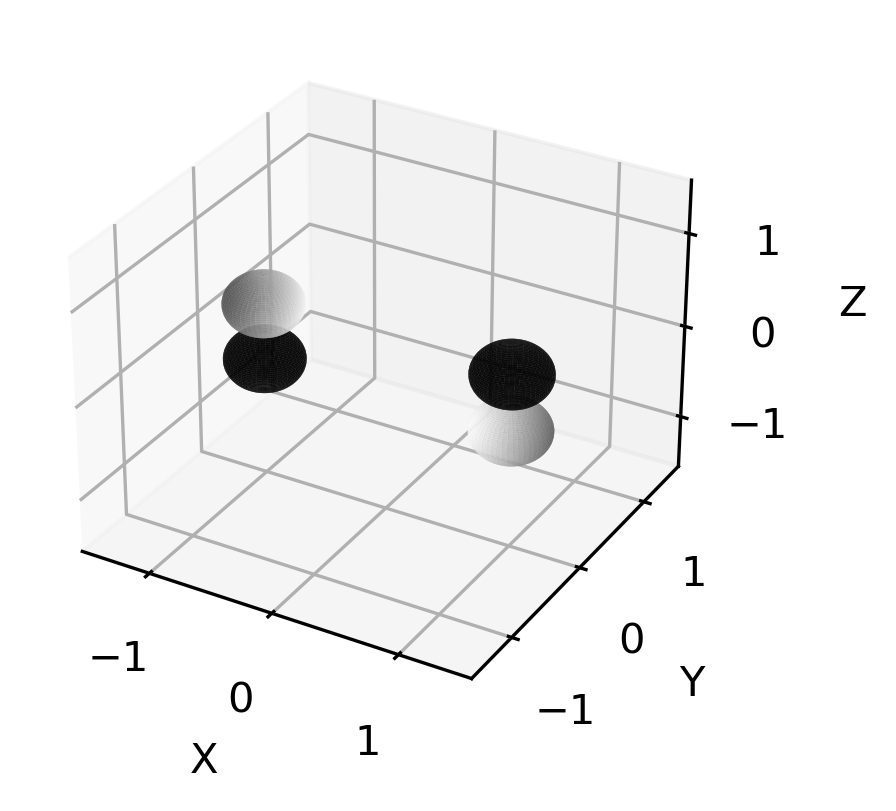

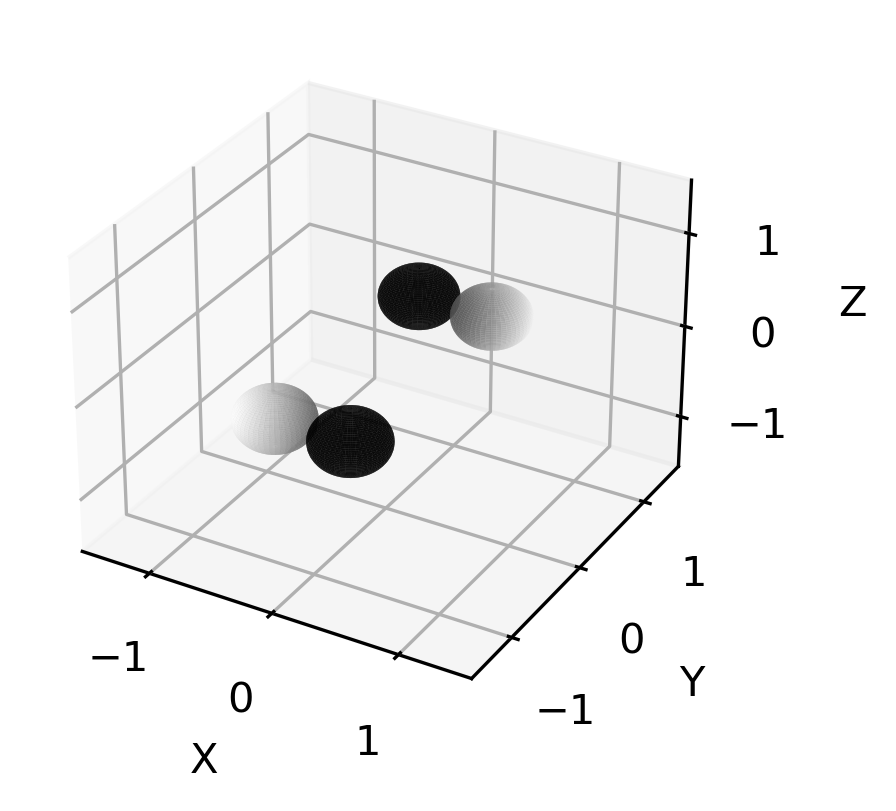

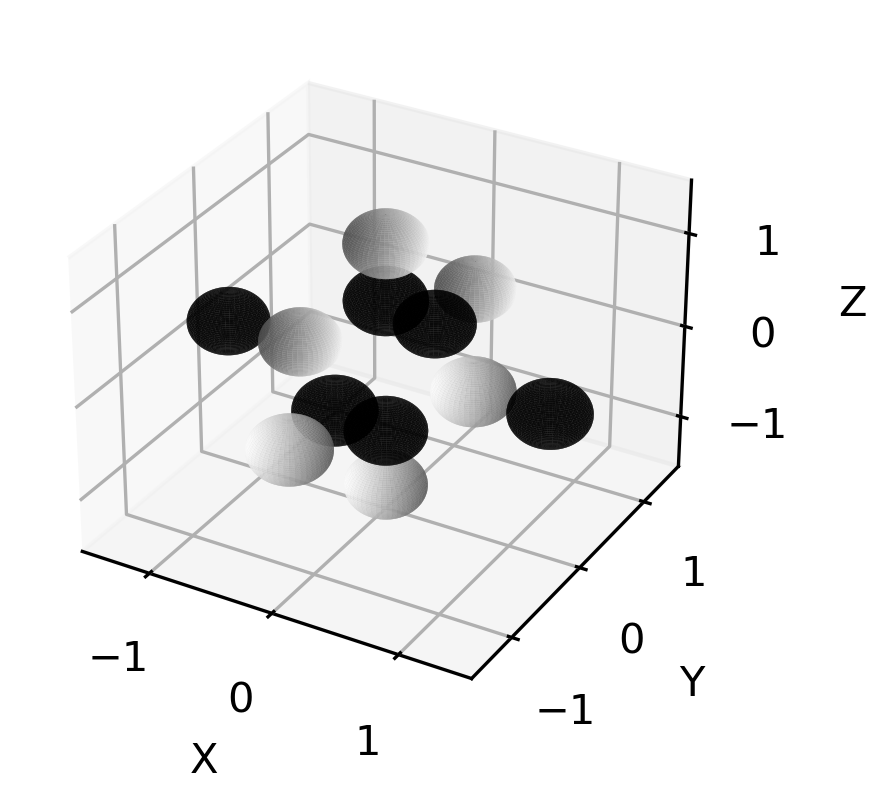

...

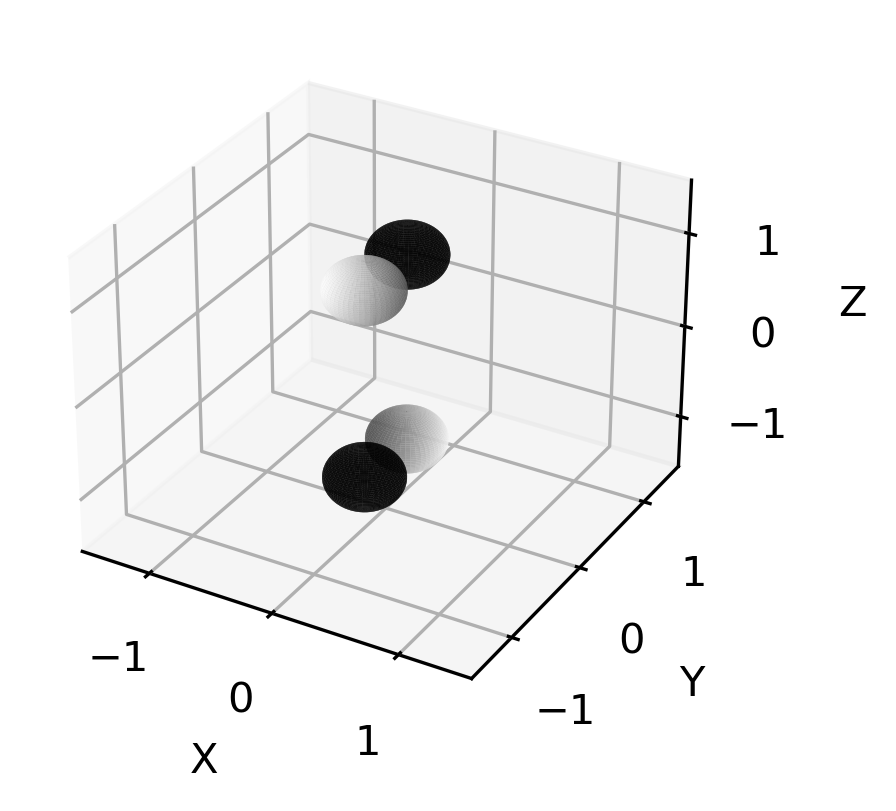

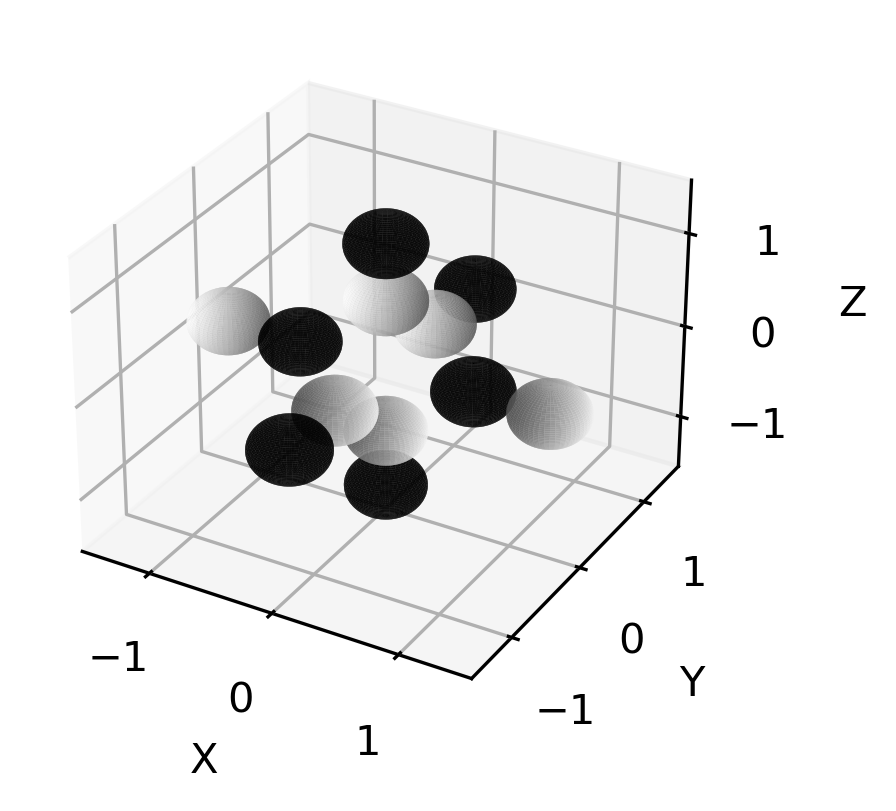

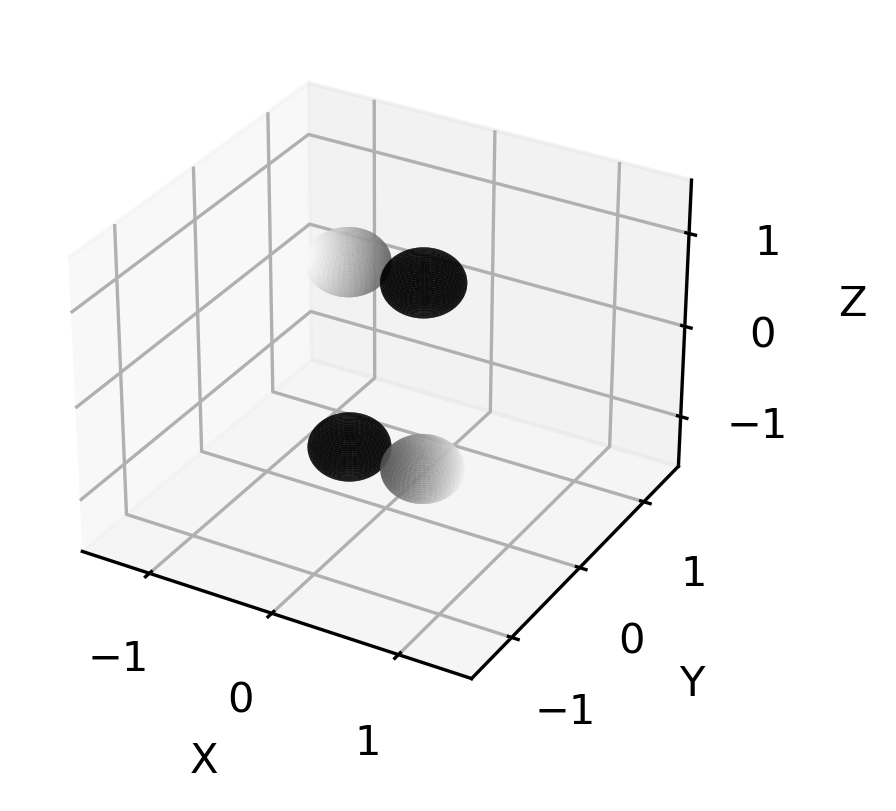

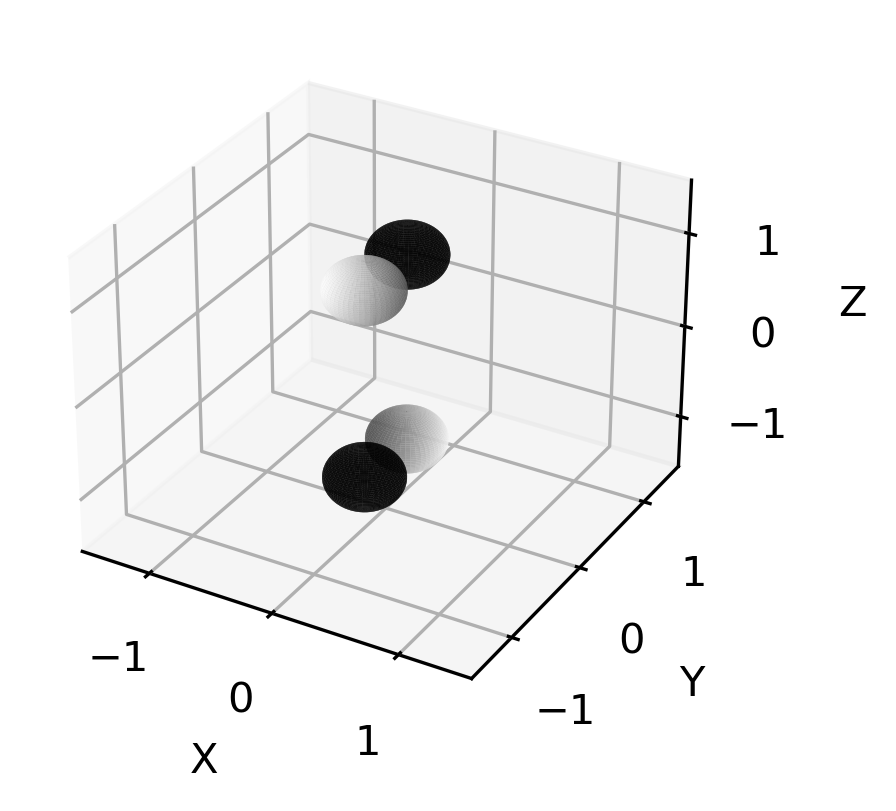

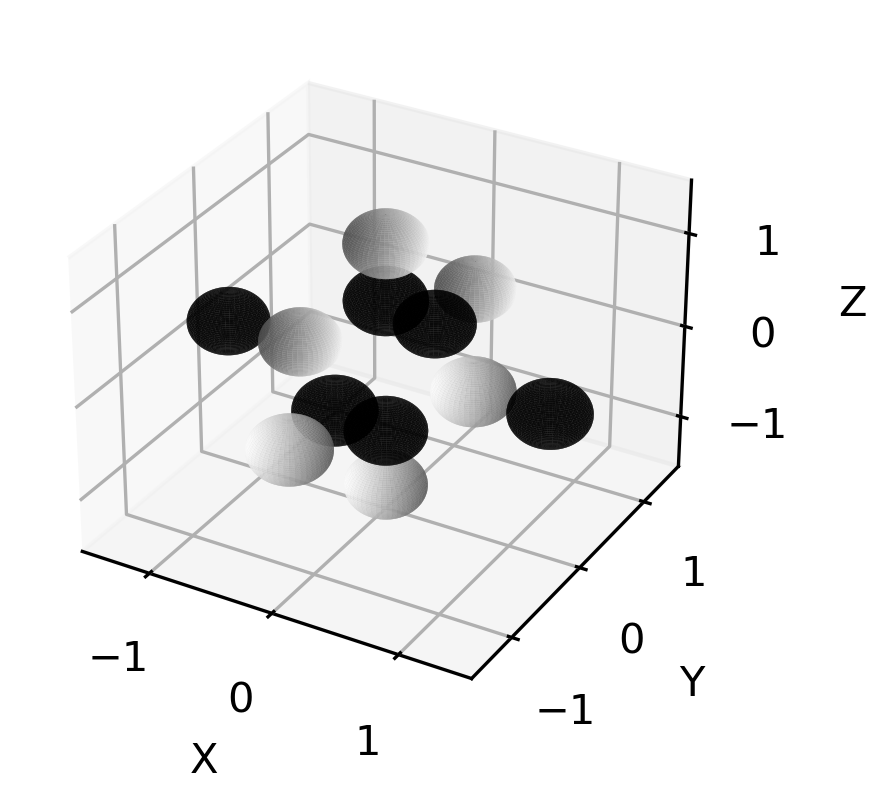

In [45]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])
plist = ["P_x_1", "P_y_1", "P_z_1", "P_x_2", "P_y_2", "P_z_2", "P_x_3", "P_y_3", "P_z_3", "P_x_4", "P_y_4", "P_z_4", "P_x_5", "P_y_5", "P_z_5", "P_x_6", "P_y_6", "P_z_6"]
basis_set = []
columns = []

for i in range(18):

    basis = np.eye(18)[:,i].reshape(18,1).astype(np.float64)
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Tplus1[index].astype(np.float64)
        g = np.kron(element.symmetry, element.transform)
        
        transformed_basis += character*(g@basis)
        
    basis_set.append(transformed_basis)

ortho_basis = gram_schmidt(basis_set)


ortho_basis = np.hstack(ortho_basis)
df = pd.DataFrame(ortho_basis, index=plist, columns=plist )

non_zero = (df != 0).any(axis=0)
display(df.loc[:, non_zero])

for col_key in df.loc[:, non_zero]:
    
    indices = df.loc[df.loc[:,col_key] != 0, col_key].index
    
    
    fig = plt.figure(figsize=(3,3), dpi=300)
    ax = plt.axes(projection='3d')
    
    for index in indices:
        
        sign = np.sign(df.loc[index, col_key])
        
        orbital, direction, point = index.split("_")
            
        position = S_orbitals[:, int(point)-1]
    
        plot_orbital(sign, direction, position)

    plt.show()
        


<h3>$T_2^{+}$</h3>

,P_x_1,P_y_1,P_z_1,P_x_2,P_y_2,P_z_2,P_x_3,P_y_3,P_z_3,P_x_4,P_y_4,P_z_4,P_x_5,P_y_5,P_z_5,P_x_6,P_y_6,P_z_6
P_x_1,0.0,0.000000,0.000000,0.000000,-0.015867,0.000000,-0.007995,0.000000,0.000000,0.000000,0.013230,0.000000,0.000000,0.000000,0.013231,0.000000,0.000000,-0.013231
P_y_1,0.0,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_1,0.0,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_x_2,0.0,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_y_2,-0.5,0.000000,0.000000,0.000000,-0.507745,0.000000,-0.503950,0.000000,0.000000,0.000000,0.506484,0.000000,0.000000,0.000000,0.502562,0.000000,0.000000,-0.502562
P_z_2,0.0,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_x_3,0.0,0.000000,0.000000,0.000000,0.015867,0.000000,0.007995,0.000000,0.000000,0.000000,-0.013230,0.000000,0.000000,0.000000,-0.013231,0.000000,0.000000,0.013231
P_y_3,0.0,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_z_3,0.0,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
P_x_4,0.0,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,-0.707107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


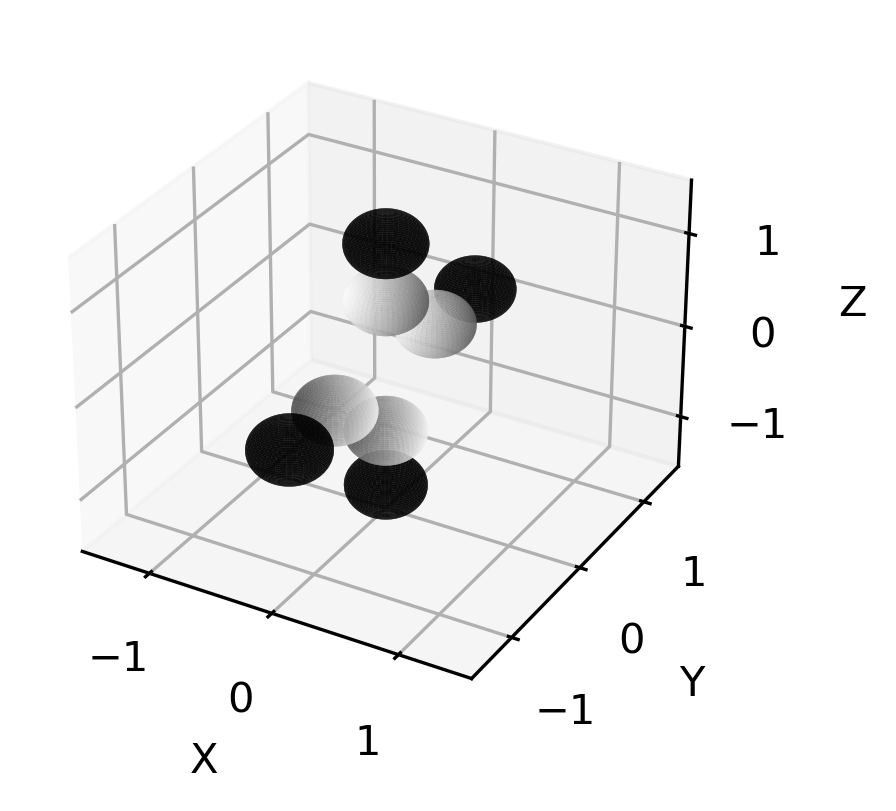

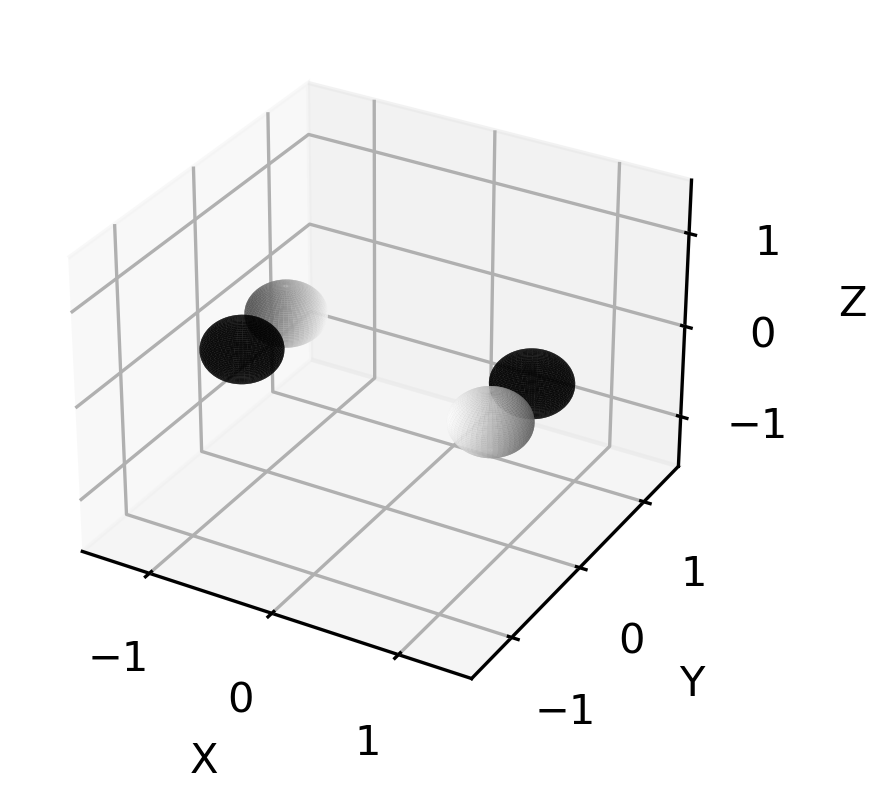

KeyboardInterrupt: 

In [46]:
classes = np.array(["E", "C_2", "C_4", "C'_2", "C_3", "i", "iC_2", "iC_4", "iC'_2", "iC_3"])
plist = ["P_x_1", "P_y_1", "P_z_1", "P_x_2", "P_y_2", "P_z_2", "P_x_3", "P_y_3", "P_z_3", "P_x_4", "P_y_4", "P_z_4", "P_x_5", "P_y_5", "P_z_5", "P_x_6", "P_y_6", "P_z_6"]
basis_set = []
columns = []

for i in range(18):

    basis = np.eye(18)[:,i].reshape(18,1).astype(np.float64)
    transformed_basis = np.zeros_like(basis)
    
    for element in Oct.elements.values():
        
        index = np.argwhere(element.symClass == classes)[0][0]
        character = Tplus2[index].astype(np.float64)
        g = np.kron(element.symmetry, element.transform)
        
        transformed_basis += character*(g@basis)
        
    basis_set.append(transformed_basis)

ortho_basis = gram_schmidt(basis_set)


ortho_basis = np.hstack(ortho_basis)
df = pd.DataFrame(ortho_basis, index=plist, columns=plist )

non_zero = (df != 0).any(axis=0)
display(df.loc[:, non_zero])

for col_key in df.loc[:, non_zero]:
    
    indices = df.loc[df.loc[:,col_key] != 0, col_key].index
    
    
    fig = plt.figure(figsize=(3,3), dpi=300)
    ax = plt.axes(projection='3d')
    
    for index in indices:
        
        sign = np.sign(df.loc[index, col_key])
        
        orbital, direction, point = index.split("_")
            
        position = S_orbitals[:, int(point)-1]
    
        plot_orbital(sign, direction, position)

    plt.show()
        


720